<a href="https://colab.research.google.com/github/hoangpnhat/Linear-Regression-vs-Logistic-Regression-Advance/blob/master/Linear_Logistic_Regression_Advance.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

#I/ Overview


**BACKGROUND**

- Vector Calculus
- Probability and Statistics
- Gradient Descent

##Bài toán


**Nhận xét**
Linear Regression và Logistic Regression đều là thuật toán thuộc lớp thuật toán học có giám sát (Supervised learning). Nhưng vì sử dụng dữ liệu và đầu ra khác nhau nên được áp dụng vào các 2 dạng bài toán khác nhau.

Ở *Linear Regression*: bài toán thống kê (Regression). Dự đoán kết quả.

Ở *Logistic Regression*: bài toán phân lớp (Classification). Dự đoán tỉ lệ kết quả.

#II/ Linear Regression 

##1) Giới thiệu

###1.1 Bài toán ví dụ

Đặt vấn đề: Ta có một căn nhà rộng $x_1 m^2$, có $x_2$ phòng ngủ và cách trung tâm thành phố $x^3$ km có giá là bao nhiêu. Giả sử chúng ta đã có số liệu thống kê từ 1000 căn nhà trong thành phố đó, liệu rằng khi có một căn nhà mới với các thông số về diện tích, số phòng ngủ và khoảng cách tới trung tâm, chúng ta có thể dự đoán được giá của căn nhà đó không? Nếu có thì hàm dự đoán sẽ có dạng như thế nào?

Một cách đơn giản nhất, chúng ta có thể thấy rằng: 

i) diện tích nhà càng lớn thì giá nhà càng cao; 

ii) số lượng phòng ngủ càng lớn thì giá nhà càng cao; 

iii) càng xa trung tâm thì giá nhà càng giảm. Một hàm số đơn giản nhất có thể mô tả mối quan hệ giữa giá nhà và 3 đại lượng đầu vào là:

$ y \approx f(x) = \overline{\rm y} $

$ f(x) = w_1 x_1 + w_2 x_2 + w_3 x_3 + w_o$


Trong đó $w_1, w_2, w_3, w_4$ là các hằng số, $w_0$ là hằng số bias.

Bài toán đi tìm các hệ số tối ưu {$w_1, w_2, w_3, w_4, w_0$} được gọi là bài toán Linear Regression.

###1.2 Mô phỏng bài toán

In [ ]:
from __future__ import division, print_function, unicode_literals
import numpy as np 
import matplotlib.pyplot as plt

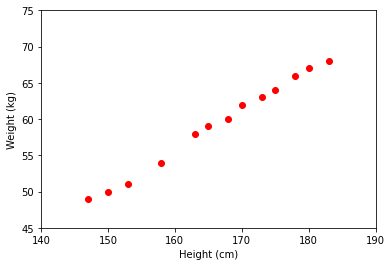

In [ ]:
# height (cm)
X = np.array([[147, 150, 153, 158, 163, 165, 168, 170, 173, 175, 178, 180, 183]]).T
# weight (kg)
y = np.array([[ 49, 50, 51,  54, 58, 59, 60, 62, 63, 64, 66, 67, 68]]).T
# Visualize data 
plt.plot(X, y, 'ro')
plt.axis([140, 190, 45, 75])
plt.xlabel('Height (cm)')
plt.ylabel('Weight (kg)')
plt.show()

Ta có các điểm dữ liệu chiều cao và cân nặng từng người. Từ đồ thị này ta thấy rằng dữ liệu được sắp xếp gần như theo 1 đường thẳng. Bài toán Linear Regression sẽ yêu cầu chúng ta tìm đường dự đoán dự vào bộ dữ liệu

w =  [[-33.73541021]
 [  0.55920496]]


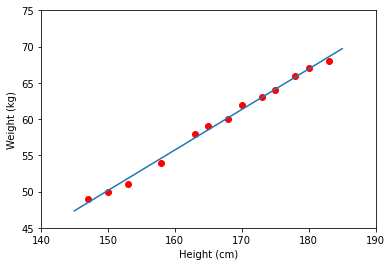

In [ ]:
# Building Xbar 
one = np.ones((X.shape[0], 1))
Xbar = np.concatenate((one, X), axis = 1)

# Calculating weights of the fitting line 
A = np.dot(Xbar.T, Xbar)
b = np.dot(Xbar.T, y)
w = np.dot(np.linalg.pinv(A), b)
print('w = ', w)
# Preparing the fitting line 
w_0 = w[0][0]
w_1 = w[1][0]
x0 = np.linspace(145, 185, 2)
y0 = w_0 + w_1*x0

# Drawing the fitting line 
plt.plot(X.T, y.T, 'ro')     # data 
plt.plot(x0, y0)               # the fitting line
plt.axis([140, 190, 45, 75])
plt.xlabel('Height (cm)')
plt.ylabel('Weight (kg)')
plt.show()


Xây dựng đường dự đoán màu xanh chính là bài toán Linear Regression

## 2) Xây dựng mô hình hồi quy tuyến tính


### 2.1 Các hàm phân lớp thường được sử dụng trong mô hình hồi quy tuyến tính

Hàm phân lớp cơ bản nhất của hồi quy tuyến tính là hàm tuyến tính của các phần tử đầu vào: $f(x) = x$. Khi ta lắp hàm phân lớp này vào một mô hình hồi quy tuyến tính, nó sẽ có dạng sau: 

$y(x, w) = w_0 + w_1x_1 + w_2x_2 + ... + w_Dx_D$, với $y(x, w)$ là mô hình, $w$ là ma trận hệ số, $D$ là số chiều của vectơ.

$\phi(x) = [{1, x_1, x_2, ..., x_D}]$ là tập hàm phân lớp của mô hình trên.

Tuy nhiên, chúng ta thêm vào các hàm phân lớp khác để phù hợp với bản chất của dữ liệu hơn như:


1.   Hồi quy đa thức: $\phi(x)_j = x^j$
2.   Hàm phân lớp Gauss: $\phi(x)_j = exp(-\frac{(x-\mu)^2}{2s^2})$
3.   Hàm phân lớp Sigmoid: $\phi(x)_j = \sigma(-\frac{x-\mu}{s})$ trong đó $\sigma(x)$ là hàm sigmoid. Tương tự, ta có thể dung hàm $tanh(x)$ thay hàm $sigma(x)$
4.  Hàm phân lớp hình sin: $\phi(x)_j = \frac{1}{2}sin(ax+b) + 1$, với a, b là hằng số
5. Biến đổi mũ
6. ...

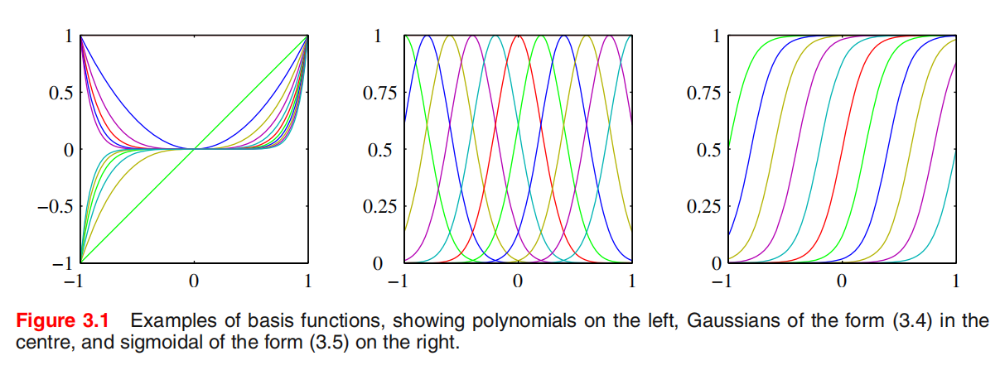

Ngoài ra để biểu thị quan hệ giữa các chiều dữ liệu, người ta còn dùng đặc trưng chéo.

Minh họa: https://developers.google.com/machine-learning/crash-course/feature-crosses/playground-exercises


###2.2 Hướng tiếp cận MLE/LS trong xây dựng hàm mất mát

Chúng ta giả sử giá trị mục tiêu(nhãn) $t = y(x, w, \phi) + \epsilon$ với $\epsilon$ là một phân phối chuẩn kỳ vọng 0 và độ chuẩn xác là số thực $\beta$. Ta có hàm khả năng: 
<br>

$p(t|x, w, \phi, \beta) = \mathcal{N}(t|y(x, w, \phi), \beta^{-1})$
<br>
$\mathbb{E}[t|x] = \int tp(t|x)dt = y(x, w, \phi)$

<br>

Xét tập dữ liệu $X = [x_1, x_2, ..., x_N]$ với các giá trị mục tiêu $t_1, t_2, ..., t_N$, được nhóm lại thành vectơ $t$.

<bb>

Ta có hàm khả năng: $p(t|X, w, \phi, \beta) = \prod_{n = 1}^{N} \mathcal{N}(t_n|w^T\phi(x_n), \beta^{-1})$
<bb>

$LL(X, w) = \ln(p(t|X, w, \phi, \beta) = \sum_{n = 1}^{N} \ln\mathcal{N}(t_n|w^T\phi(x_n), \beta^{-1}) = \frac{N}{2}\ln\beta - \frac{N}{2}\ln(2\pi) - \frac{1}{2}\beta\sum_{n=1}^{N}(t_n-w^T\phi(x_n))^2$
<bb>

Trong đó hàm $\sum_{n=1}^{N}(t_n-w^T\phi(x_n))^2$ là hàm tổng bình phương (SSE), $LL(X, w) = SSE + $ hằng số. Vậy ta có thể xem như bản chất của bình phương nhỏ nhất và ước lượng hợp lý cực đại là như nhau.

<bb>
$\nabla_w LL(X, w) = \nabla\ln(p(t|X, w, \phi, \beta) = -\beta\sum_{n=1}^{N}(t_n-w^T\phi(x_n))\phi(x_n)^T =  -\beta\sum_{n=1}^{N}t_n\phi(x_n)^T + \beta w^T\sum_{n=1}^{N}\phi(x_n)\phi(x_n)^T$

$w_{ML} = argmax_w(LL(X, w)) \Leftrightarrow \nabla_w LL(X, w_{ML}) = 0$
<br>

Giải phương trình tìm $w_{ML}$ ta được: $w_{ML} = (\Phi^T\Phi)^{-1}\Phi^Tt$ trong đó $\Phi$ được định nghĩa là ma trân kích thước $N * M$, $\Phi_{nj} = \phi_j(x_n)$

Ta có thể dễ dàng xác định được $w_{ML}$ là nghiệm duy nhất của phương trình $\nabla_w LL(X, w) = 0$ bằng cách tính đạo hàm cấp 2 của $LL(x, w)$

Đây còn gọi là thuật toán OLS.

###2.3 Những khó khăn khi thực hiện thuật toán OLS

Đôi khi, việc tính toán nghiệm ước lượng hợp lý tối đại có chi phí rất lớn bởi các bộ test lớn. Vậy nên, việc thực hiện các thuật toán dạng chuỗi như SGD sẽ làm cho $\nabla_w LL$ tiến về 0 nhanh hơn.

$w_{r+1} = w_{r} - \eta \nabla_w LL(X_{rand(1,N)},w_r) =  w_{r} - \eta (t_{rand(1,N)}-w^T\phi(X_{rand(1,N)}))\phi(X_{rand(1,N)})$
<br>

Tuy nhiên, thuật toán OLS không được khuyến khích dùng nhiều bởi còn một rào cản: ma trận $\Phi^T\Phi$ có thể không được tốt cho lắm(thưa, gần với không khả nghịch, ...). Trong trường hợp ma trận rất thưa(số lượng bộ dữ liệu nhỏ hơn nhiều so với số lượng chiều của đầu vào bài toán) ta sẽ sử dụng SVD.

Để tính nghịch đảo ma trận $w_{ML}$ bằng SVD ta làm như sau:
Phân rã ma trận $\Phi = U\Sigma V^T$
<br>

$w_{ML} = (\Phi^T\Phi)^{-1}\Phi^Tt = (V\Sigma^T U^T U\Sigma V^T)^{-1} V\Sigma^T U^T = (V\Sigma^T \Sigma V^T)^{-1} V\Sigma^T U^T = V(\Sigma^T\Sigma)^{-1}\Sigma^T U^T$

Bằng cách này, độ phức tạp thời gian của chúng ta sẽ là $O(DN^2)$ với N là số lượng bộ dữ liệu, D là số chiều của đầu vào bài toán.

Ta còn có thể sử dụng ma trận $\Sigma$ để giảm số chiều của bài toán(dữ liệu không cần thiết).

Ngoài ra, QR decompostion cũng được dùng để giải quyết vấn đề này ở trường hợp khác.

###2.4 Bài toán nhiều đầu ra

Đến đây, chúng ta chỉ giải quyết trường hợp có duy nhất một biến mục tiêu $t$. Trong nhiều trường hợp, chúng ta cần phải dự đoán một lượng $K>1$ biến ngẫu nhiên, ta kí hiệu lại biến mục tiêu là vectơ $t$ cho trường hợp tổng quát hơn. Điều này có thể được thực hiện bằng cách với mỗi biến mục tiêu, ta dùng một tập các hàm phân lớp khác nhau, tuy nhiên, một cách tiếp cận thông thường và hấp dẫn hơn là dùng một tập duy nhất các hàm phân lớp để xây mô hình sao cho:
$y(x,w,\phi) = W^T\phi(x)$, với $W$ là một ma trận có kích thước $M*K$

Ta có hàm khả năng tương ứng: $p(t|x, w, \phi, \beta) = \mathcal{N}(t|W^T\phi(x), \beta^{-1}I)$

$LL(p) = \sum_{n = 1}^{N} \ln\mathcal{N}(t_n|W^T\phi(x_n), \beta^{-1}) = \frac{NK}{2}\ln\frac{\beta}{2\pi} - \frac{\beta}{2}\sum_{n=1}^{N}|t_n-W^T\phi(x_n)|^2$

Ở đây, để ký hiệu đỡ rối, các bạn hãy tưởng tượng rằng trước đây mỗi phần tử x là một biến thuộc tập $\mathbb{R}$, thì sau đó là một biến thuộc tập $\mathbb{R}^K$, các hàm khác được xây dựng tương tự.

$W_{ML} = (\Phi^T\Phi)^{-1}\Phi^Tt$

Vậy bài toán nhiều đầu ra có thể được phân rã thành bài toán một đầu ra một cách dễ dàng, từ giờ trở đi, chúng ta chỉ xét bài toán một đầu ra nhằm giảm độ phức tạp của bài viết.

##3) Chính quy hóa và phân tích MAP

###3.1 Sự quá khớp(Overfitting)

Trong những trường hợp dữ liệu quá nhỏ để cho máy có thể học được, việc áp dụng các thuật toán thông thường như trên tuy tối thiểu hóa được lỗi huấn luyện, nhưng để tối thiểu hóa lỗi tổng quát là một câu chuyện khác. Vấn đề trên được gọi là sự quá khớp(overfitting). Chúng ta có thể hình dung sự quá khớp thông qua ví dụ dưới đây.

Có 50 điểm dữ liệu được tạo bằng một đa thức bậc ba cộng thêm nhiễu. Tập dữ liệu này được chia làm hai, 30 điểm dữ liệu màu đỏ cho training data, 20 điểm dữ liệu màu vàng cho test data. Đồ thị của đa thức bậc ba này được cho bởi đường màu xanh lục. Bài toán của chúng ta là giả sử ta không biết mô hình ban đầu mà chỉ biết các điểm dữ liệu, hãy tìm một mô hình “tốt” để mô tả dữ liệu đã cho.

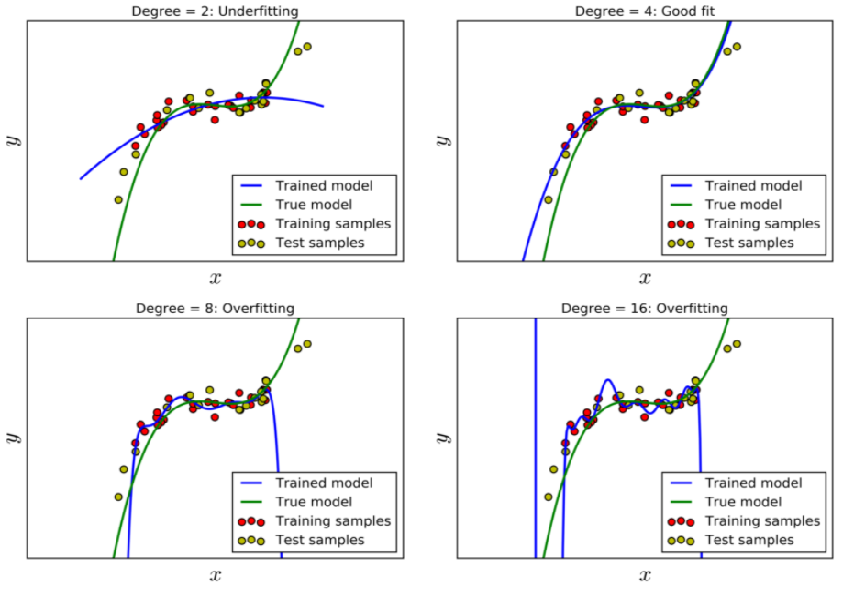

Nguồn: https://github.com/tiepvupsu/tiepvupsu.github.io/blob/master/assets/15_overfitting/LinReg.ipynb

Hồi quy Ridge và Lasso bằng cách thêm hình phạt vào giúp cho kết quả sẽ không quá phụ thuộc vào bộ dữ liệu. Việc quá khớp với dữ liệu training có thể khiến kết quả bị nhiễu, chất lượng mô hình sẽ không tốt trên tập test nữa.

###3.2 Ridge Regression

#### Công thức Ridge Regression



Dựa vào công thức Bayes:

$$P(Model|Data) = \frac{P(Data|Model)P(Model)}{P(Data)}$$

Hay là

$$P(y(x, w, \phi)|D) = \frac{P(D|y(x, w, \phi))P(y(x, w, \phi))}{P(D)}$$

Trong đó $P(D|y(x, w, \phi))$ chính là hàm khả năng, được xấp xỉ theo phân phối chuẩn $\mathcal{N}(D|y(x, w, \phi), \beta^{-1})$

Đây còn được gọi là MAP(Maximum a posteriori).

Ở ước lượng hợp lý lớn nhất, chúng ta tìm cách tối ưu hóa $P(y(x, w, \phi)|D)$ bằng cách tối ưu hóa $P(D|y(x, w, \phi))$ và cho rằng $\frac{P(y(x, w, \phi))}{P(D)}$ là một hằng số hay phân phối đều. Và bản chất của hàm chính quy hóa $L_2$ là cho rằng $P(y(x, w, \phi))$ xấp xỉ phân phối chuẩn $\mathcal{N}(w^Tw|0, \lambda^{-1})$.

Tương tự như hàm khả năng, sau khi tính, ta sẽ thu về kết quả rằng $LL(P(y(x,w,\phi)))$ tỉ lệ thuận với hàm bình phương.

Gọi:
1. $E_D(w)$ là hàm lỗi của dữ liệu huấn luyện
2. $E_T(w)$ là hàm lỗi của dữ liệu thực tế/kiểm tra
3. $E_W(w)$ là hàm chính quy hóa, với $\lambda$ là hệ số chính quy.

Ta có hàm lỗi như sau: $E(w) = E_D(w) + \lambda E_W(w)$

Một trong các hàm chính quy hóa là hàm $L_2 = E_W(w) = \frac{1}{2}w^Tw$.

Khi áp dụng hàm $L_2$ vào $E_W$ và SSE vào $E_D$, ta có được 

$$E(w) = SSE + L_2 = \frac{1}{2}\sum_{n=1}^{N}(t_n-w^T\phi(x_n))^2 + \frac{\lambda}{2}w^Tw$$

$$\nabla_w E = \nabla_w E_D + \nabla_w L_2 = \nabla_w SSE + \lambda w$$

#### Mô hình đánh giá Ridge dựa trên thông số  λ

In [ ]:
import cvxpy as cp
import numpy as np
import matplotlib.pyplot as plt

In [ ]:
def loss_fn(X, Y, beta):
    return cp.pnorm(cp.matmul(X, beta) - Y, p=2)**2

def regularizer(beta):
    return cp.pnorm(beta, p=2)**2

def objective_fn(X, Y, beta, lambd):
    return loss_fn(X, Y, beta) + lambd * regularizer(beta)

def mse(X, Y, beta):
    return (1.0 / X.shape[0]) * loss_fn(X, Y, beta).value

Tạo bộ dữ liệu

In [ ]:
def generate_data(m=100, n=20, sigma=5):
    "Generates data matrix X and observations Y."
    np.random.seed(1)
    beta_star = np.random.randn(n)
    # Generate an ill-conditioned data matrix
    X = np.random.randn(m, n)
    # Corrupt the observations with additive Gaussian noise
    Y = X.dot(beta_star) + np.random.normal(0, sigma, size=m)
    return X, Y

m = 100
n = 20
sigma = 5

X, Y = generate_data(m, n, sigma)
X_train = X[:50, :]
Y_train = Y[:50]
X_test = X[50:, :]
Y_test = Y[50:]

In [ ]:
beta = cp.Variable(n)
lambd = cp.Parameter(nonneg=True)
problem = cp.Problem(cp.Minimize(objective_fn(X_train, Y_train, beta, lambd)))

lambd_values = np.logspace(-2, 3, 50)
train_errors = []
test_errors = []
beta_values = []
for v in lambd_values:
    lambd.value = v
    problem.solve()
    train_errors.append(mse(X_train, Y_train, beta))
    test_errors.append(mse(X_test, Y_test, beta))
    beta_values.append(beta.value)

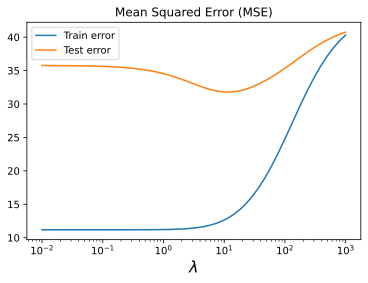

In [ ]:
%matplotlib inline
%config InlineBackend.figure_format = 'svg'

def plot_train_test_errors(train_errors, test_errors, lambd_values):
    plt.plot(lambd_values, train_errors, label="Train error")
    plt.plot(lambd_values, test_errors, label="Test error")
    plt.xscale("log")
    plt.legend(loc="upper left")
    plt.xlabel(r"$\lambda$", fontsize=16)
    plt.title("Mean Squared Error (MSE)")
    plt.show()
    
plot_train_test_errors(train_errors, test_errors, lambd_values)

Đánh giá mô hình

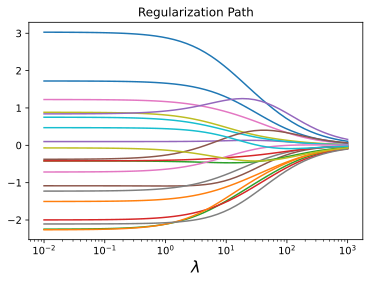

In [ ]:
def plot_regularization_path(lambd_values, beta_values):
    num_coeffs = len(beta_values[0])
    for i in range(num_coeffs):
        plt.plot(lambd_values, [wi[i] for wi in beta_values])
    plt.xlabel(r"$\lambda$", fontsize=16)
    plt.xscale("log")
    plt.title("Regularization Path")
    plt.show()
    
plot_regularization_path(lambd_values, beta_values)

Ta thấy: Khi $\lambda$ tăng, các tham số thu hẹp dần về 0. 

Trong thực tế, những tham số tiếp cận 0 chậm hơn những tham số khác có thể tương ứng với các tính năng nhiều thông tin hơn.

###3.3 Lasso Regression


Về cơ bản: Hồi quy Lasso khá giống với hồi quy ridge

#### Công thức:

Hồi quy Lasso khác với hồi quy ridge ở chỗ lựa chọn hình phạt: lasso áp dụng hình phạt $\ell_1$ trên các tham số $\beta$. Công thức độ lệch là:

$$f(\beta) = \sum_{1}^{n}|Y_i - \sum_{1}^{p}X_{ij}\beta_j|^2 + \lambda \sum_{1}^{p}|\beta_j|$$
- λ biểu thị lượng co ngót.
- λ = 0 tương đương với hồi quy tuyến tính thông thường
- Độ lệch tăng khi tăng λ
- phương sai tăng khi giảm λ

trong đó  $\lambda$ là một tham số, $X$ là dữ liệu huấn luyện và $Y$ là dự đoán. Hình phạt $\ell_1$ khuyến khích khiến nhiều hệ số trả về 0

Như vậy sự khác biệt của Lasso và Ridge là hình phạt L2 của hồi quy Ridge là hình phạt $\ell_2 = \lambda \sum_{1}^{p}\beta_j^2$ thành hình phạt $\ell_1 = \lambda \sum_{1}^{p}|\beta_j|$

####Phân tích hồi quy Lasso

#### Phân tích dựa theo đưa công thức về hình học

$$f(\beta) = \sum_{1}^{n}|Y_i - \sum_{1}^{p}X_{ij}\beta_j|^2 + \lambda \sum_{1}^{p}|\beta_j|$$ 
$$ = \quad RSS \quad\quad\quad + \quad\quad\quad \ell_1     $$

Giả sử $ β=(β_1,β_2) $, ta có tổng bình phương phần dư RSS

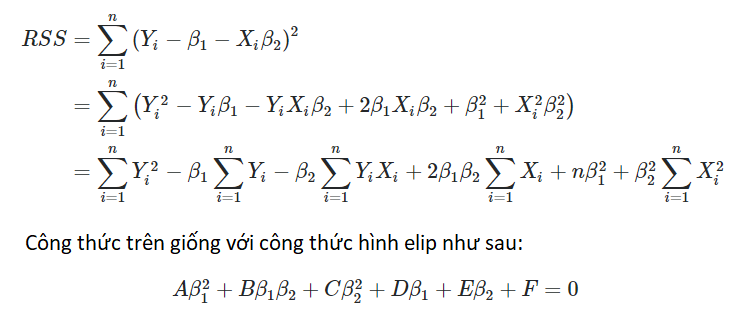

Nguồn: https://en.wikipedia.org/wiki/Conic_section

Và $\ell_1 $ sẽ có dạng hình thoi vì $ |B_1| + |B_2| $ công thức đối trị tuyệt đối đối xứng qua các trục Ox và Oy

Ta có hình vẽ bên trái:

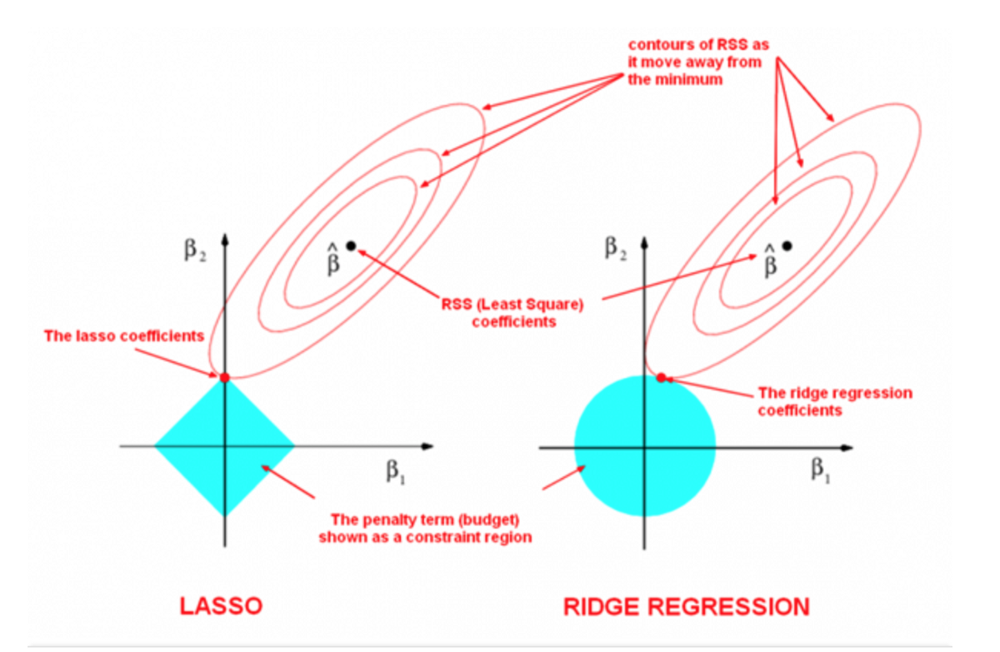

Lasso thực hiện $ \ell_1 $ co lại, do đó có "góc" trong ràng buộc, theo hai chiều tương ứng với hình thoi. Nếu tổng các hình vuông "chạm" vào một trong các góc này, thì hệ số tương ứng với trục sẽ bị thu hẹp về 0.

Nếu p tăng lên, hình thoi nhiều chiều có số góc ngày càng tăng, và do đó, rất có thể một số hệ số sẽ được đặt bằng 0. Nên lasso thực hiện thu nhỏ hiệu quả việc lựa chọn tập hợp con.

####Mô hình đánh giá lasso dựa trên thông số $\lambda$. 

In [ ]:
import cvxpy as cp
import numpy as np
import matplotlib.pyplot as plt

a least squares loss function and an  ℓ1  regularizer

In [ ]:
def loss_fn(X, Y, beta):
    return cp.norm2(cp.matmul(X, beta) - Y)**2

def regularizer(beta):
    return cp.norm1(beta)

def objective_fn(X, Y, beta, lambd):
    return loss_fn(X, Y, beta) + lambd * regularizer(beta)

def mse(X, Y, beta):
    return (1.0 / X.shape[0]) * loss_fn(X, Y, beta).value

Tạo bộ dữ liệu

In [ ]:
def generate_data(m=100, n=20, sigma=5, density=0.2):
    "Generates data matrix X and observations Y."
    np.random.seed(1)
    beta_star = np.random.randn(n)
    idxs = np.random.choice(range(n), int((1-density)*n), replace=False)
    for idx in idxs:
        beta_star[idx] = 0
    X = np.random.randn(m,n)
    Y = X.dot(beta_star) + np.random.normal(0, sigma, size=m)
    return X, Y, beta_star

m = 100
n = 20
sigma = 5
density = 0.2

X, Y, _ = generate_data(m, n, sigma)
X_train = X[:50, :]
Y_train = Y[:50]
X_test = X[50:, :]
Y_test = Y[50:]


In [ ]:
beta = cp.Variable(n)
lambd = cp.Parameter(nonneg=True)
problem = cp.Problem(cp.Minimize(objective_fn(X_train, Y_train, beta, lambd)))

lambd_values = np.logspace(-2, 3, 50)
train_errors = []
test_errors = []
beta_values = []
for v in lambd_values:
    lambd.value = v
    problem.solve()
    train_errors.append(mse(X_train, Y_train, beta))
    test_errors.append(mse(X_test, Y_test, beta))
    beta_values.append(beta.value)

Đánh giá mô hình

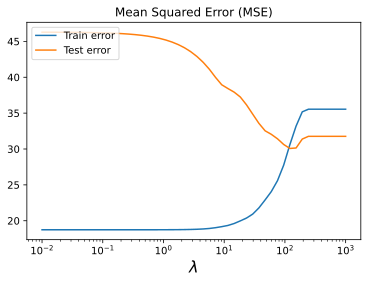

In [ ]:
%matplotlib inline
%config InlineBackend.figure_format = 'svg'

def plot_train_test_errors(train_errors, test_errors, lambd_values):
    plt.plot(lambd_values, train_errors, label="Train error")
    plt.plot(lambd_values, test_errors, label="Test error")
    plt.xscale("log")
    plt.legend(loc="upper left")
    plt.xlabel(r"$\lambda$", fontsize=16)
    plt.title("Mean Squared Error (MSE)")
    plt.show()
    
plot_train_test_errors(train_errors, test_errors, lambd_values)

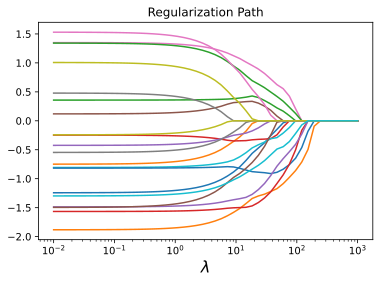

In [ ]:
def plot_regularization_path(lambd_values, beta_values):
    num_coeffs = len(beta_values[0])
    for i in range(num_coeffs):
        plt.plot(lambd_values, [wi[i] for wi in beta_values])
    plt.xlabel(r"$\lambda$", fontsize=16)
    plt.xscale("log")
    plt.title("Regularization Path")
    plt.show()
    
plot_regularization_path(lambd_values, beta_values)

Khi $\lambda$ tăng, các tham số được thu hẹp dần về 0 và tỉ lệ tham số bằng 0 tăng. 

Lasso có xu hướng đưa ra một tập hợp các hệ số hồi quy bằng 0 và dẫn đến một giải pháp thưa thớt. Còn Ridge thường thì không

####So sánh đặc điểm Lasso và Ridge

- Bởi vì xu hướng thu hẹp các hệ số dần về 0, nên Lasso tạo ra một mô hình dự đoán đơn giản hơn. 

- Giống Ridge ở điểm: Khi λ tăng -> phương sai giảm và độ lệch tăng 

- Nhược điểm Lasso: Số lượng biến bị giới hạn bởi bộ dữ liệu. Và việc các = 0 nhiều dẫn đến thông tin bị mất đi.

####Elastic Net

Là sự kết hợp giữa Lasso và Ridge:

$$f(\beta) = \sum_{1}^{n}|Y_i - \sum_{1}^{p}X_{ij}\beta_j|^2 + \lambda \sum_{1}^{p}|\beta_j| + \lambda \sum_{1}^{p}\beta_j^2$$ 
$$ = \quad RSS \quad\quad\quad + \quad\quad\quad \ell_1 + \quad\quad\quad \ell_2     $$

Trong đó : 

- $𝑙_1$: Buộc các biến nhất định bằng 0

- $𝑙_2$: Giúp hệ số các biến tương quan với nhau có xu hướng bằng nhau và ổn định $l_1$. Do đó cải thiện dự đoán

###3.4 Các vấn đề khi thực hiện chính quy hóa

Việc chính quy hóa giúp cho những mô hình phức tạp có thể được huấn luyện trên các tập dữ liệu nhỏ, làm giảm thiểu độ phức tạp của mô hình. Tuy nhiên vấn đề về tìm độ phức tạp tối ưu của mô hình là tương đương với việc chọn hàm chính quy hóa $E_W$ và hệ số chính quy $\lambda$ phù hợp. Một trong các cách đó có thể được liệt kê như sau:

1.   Kiểm tra chéo k phần(K-fold cross validation): Chia Data thành 3 phần(Train, Test, Evaluate) và chia tập train thành k phần
2.   Elastic Net Regression: $E(w) = E_D(w) + \lambda_1 L_1(w) + \lambda_2 L_2(w)$

###3.5 Đánh đổi giữa độ lệch(Bias) và phương sai(Variance)

Việc tối ưu ước lượng hợp lý lớn nhất hay tổng bình phương lỗi nhỏ nhất có thể làm vấn đề quá khớp nghiêm trọng. Tuy nhiên, việc hạn chế số lượng hàm phân lớp nhằm để tránh sự quá khớp làm giảm đi độ linh hoạt của mô hình để nắm bắt được những xu hướng thú vị và quan trọng của dữ liệu. Mặc dù đưa vào hệ số chính quy hóa $\lambda$ để kiểm soát sự quá khớp, điều này dẫn đến các vấn đề khác đã được nêu ở trên, và rõ ràng nếu ta xem $\lambda$ như là một biến để tối ưu hàm lỗi dựa trên dữ liệu, thì $\lambda = 0$ là một đáp án. Rõ ràng đây không phải cách để giải quyết vấn đề này.

Đặt $h(x)$ là hàm đưa ra dự đoán tối ưu, $h(x) = \mathbb{E}[t|x] = \int tp(t|x)dt$ với $x$ là vectơ đầu vào, $t$ là biến mục tiêu.

Ta tính kì vọng mất mát khi chọn làm mất mát $L(t,y(x))=(t-y(x))^2$ như sau:

$$E[L] = \int\int L(t,y(x))p(x,t)dxdt = \int\int (t-y(x))^2p(x,t)dxdt$$

Ta thêm và bớt một lượng $h(x)$ vào $t-y$:

$$E[L] = \int\int (t-h(x)+h(x)-y(x))^2p(x,t)dxdt =\int\int (h(x)-t)^2 + (y(x)-h(x))^2 + 2(t-h(x))(h(x)-y(x))dxdt$$

Lấy tích phân trên $t$ trước ta được:

$$E[L] = \int (h(x)-t)^2p(x)dxdt + \int (y(x)-h(x))^2p(x)dx = variance + bias^2$$

Tuy nhiên, vì chúng ta làm việc với các bộ dữ liệu hữu hạn, nên sẽ viết lại hàm trên dưới dạng sau:

$$\mathbb{E}_D[L(x,D)] = (\mathbb{E}_D[y(x,D)]-h(x))^2 + \mathbb{E}_D[(y(x,D)-\mathbb{E}_D[y(x,D)))^2]$$

Ta gọi $\mathbb{E}_D[y(x,D)]-h(x)$ chính là độ lệch và $\mathbb{E}_D[(y(x,D)-\mathbb{E}_D[y(x,D)))^2]$ chính là phương sai. Vậy kì vọng lỗi là tổng của bình phương độ lệch, phương sai và nhiễu(bản chất xác suất của bài toán, không thể tối ưu hóa được, có thể xem như là một hằng số).

Mục đích của chúng ta là tối thiểu hóa kì vọng lỗi mà ta đã đưa về 3 thành phần. Sau đây chúng ta sẽ thấy rằng có một sự đánh đổi giữa thiên kiến và phương sai, ví dụ về 100 bộ dữ liệu trong đó mỗi bộ dữ liệu chứa 25 điểm dữ liệu độc lập với $h(x) = sin(2\pi x)$. Các bộ dữ liệu l được đánh số từ 1 đến L, với L = 100. Với mỗi bộ dữ liệu ta sẽ tối ưu dùng một mô hình $y_l$ với 24 hàm phân lớp Gauss với các hệ số chính quy khác nhau:

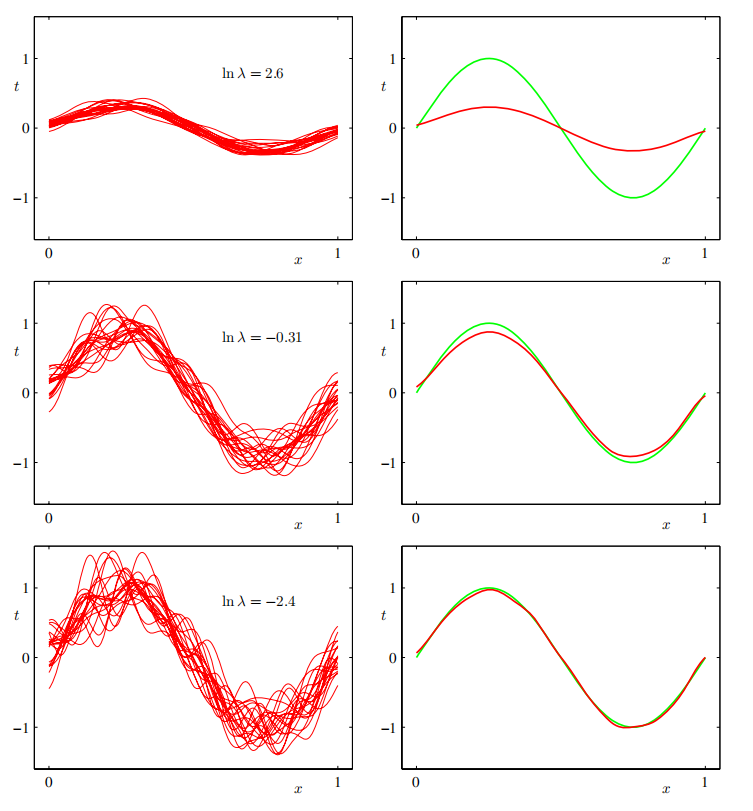

Thứ tự từ trên xuống dưới hệ số chính quy $\lambda$ giảm dần, trong đó đường màu đỏ bên trái là 100 đường $y_l$, đường màu đỏ bên phải là trung bình của các đường màu đỏ bên trái và đường màu xanh là $h(x)$. Ta cũng nhận thấy trung bình các đáp án cho một mô hình phức tạp có thể là đưa ra kết quả rất hợp lý. Thật vậy, trung bình là trọng tâm của cách tiếp cận Bayes(nhưng không phải trung bình các bộ dữ liệu mà dựa trên xác suất hậu nghiệm của các tham số). Trước khi qua cách tiếp cân Bayes, ta sẽ rút ra các công thức trong phần này:

$bias^2 = \frac{1}{N}\sum_{i = 1}^N(\frac{1}{L}\sum_{l=1}^Ly_l(x_n)-h(x_n))^2$


$variance = \frac{1}{N}\sum_{i = 1}^N\frac{1}{L}\sum_{l=1}^L(y_l(x_n)-\frac{1}{L}\sum_{l=1}^Ly_l(x_n))^2$

Biểu đồ quan hệ giữa $bias^2$, $variance$, $bias^2+variance$, lỗi với hệ số chính quy $\lambda$:

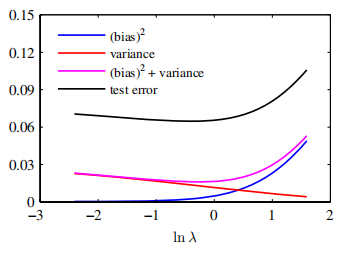

## 4) Robust Linear Regression

In [ ]:
beta = cp.Variable(n)
lambd = cp.Parameter(nonneg=True)
problem = cp.Problem(cp.Minimize(objective_fn(X_train, Y_train, beta, lambd)))

lambd_values = np.logspace(-2, 3, 50)
train_errors = []
test_errors = []
beta_values = []
for v in lambd_values:
    lambd.value = v
    problem.solve()
    train_errors.append(mse(X_train, Y_train, beta))
    test_errors.append(mse(X_test, Y_test, beta))
    beta_values.append(beta.value)

Thông thường trong regression model, ta thường sử dụng phân phối Gaussian với giá trị trung bình bằng 0, và  phương sai là hằng số, $r_n \sim \mathcal N(0, \sigma^2)$, với $r_n = y_n - \mathbf w^{\mathrm T} \mathbf x$. Trong trường hợp này việc tối đa giá trị likelihood tương tự như việc tối thiểu SSE. Tuy nhiên, trong bài toán có outliers, kết quả sẽ fit tệ hơn. Do SSE có dạng đồ thị bậc hai, nên các điểm ở xa đường thẳng sẽ ảnh hưởng nhiều hơn so với các điểm ở gần đường thẳng. Ta sẽ gọi phương pháp xử lí dạng này là **Robust Linear Regression**

Một cách xử lí outliers là ta thay thế phân phối Gausian bằng các phân phối khác có **heavy tails**. (Việc này sẽ tăng việc chỉ định likelihood cho outliers cao hơn). Dưới đây bảng tóm tắt các likelihood, priors và posterior cho linear regression

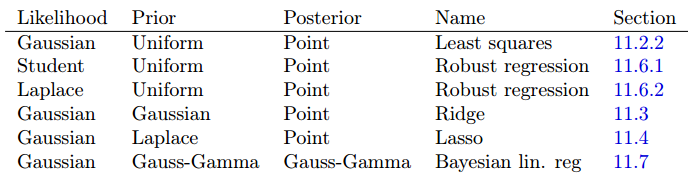

Hàm likelihood thể hiện $p(y|\mathbf x,\mathbf w,\sigma^2)$

Hàm tiền nghiệm (prior) là $p(\mathbf w)$

Hàm hậu nghiệm (posterior) là $p(\mathbf w|\mathcal D)$

"Point" được viết tắt cho phân phối suy biến $\delta (\mathbf w -\hat{\mathbf w})$. Ở đây $\hat {\mathbf w}$ được tính bởi MAP estimate. MLE được tính cho Uniform Prior và Point Posterior

### 4.1 Student-t likelihood
Ta có: $p(y|\mathbf x, \mathbf w, \sigma ^2, \nu)=\mathcal T(y|\mathbf w^{\mathrm T} \mathbf x,\sigma^2,\nu)$



#### (*) Giới thiệu về thuật toán EM
Thuật toán EM (Expectation Maximization), là thuật toán sử dụng để tính MLE hay là MAP estimate dành cho **missing data**(dữ liệu bị thiếu) hay là **hidden variables**(các biến ẩn). Thuật toán này bao gồm 2 bước E-step và M-step

Gọi $\mathbf y_n,\mathbf z_n$ lần lượt là dữ liệu hiển thị và dữ liệu bị ẩn của mẫu $n$ 



##### **Lower bound(Chặn dưới)**

Mục tiêu: tối đa giá trị log likelihood của dữ liệu quan sát được
$$\mathrm {LL}(\theta)=\sum_{n=1}^N \log p(\mathbf y_n|\theta)=\sum_{n=1}^N \left[\log \sum_{z_n}p(\mathbf y_n,\mathbf z_n|\theta)\right]$$
Chọn $q(\mathbf z_n)$ là tập phân phối tùy ý cho mỗi dữ liệu bị ẩn $\mathbf z_n$
$$\mathrm {LL}(\theta)=\sum_{n=1}^N \left[\log \sum_{\mathbf z_n} q_n(\mathbf z_n) \frac{p(\mathbf y_n,\mathbf z_n|\theta)}{q_n(\mathbf z_n)} \right]$$
Bởi vì hàm $\log$ là hàm lõm, áp dụng bất đẳng thức Jensen
$$\mathrm {LL}(\theta)\geq \sum_n \sum_{\mathbf z_n}q_n(\mathbf z_n)\log \frac{p(\mathbf y_n,\mathbf z_n|\theta)}{q_n(\mathbf z_n)}  $$
$$=\sum_n \mathbb E_{q_n}[\log p(\mathbf y_n,\mathbf z_n|\theta) +\mathbb H(q_n)$$
$$=\sum_n \xi(\theta,q_n|\mathbf y_n)\overset{\triangle}{=} \sum_n \xi (\theta, \{q_n\}|\mathcal D)$$ 
Ở đây $\mathbb H$ là hàm entropy, $\xi(\theta, \{q_n\}|\mathcal D)$ là **evidence lower bound (ELBO)**

##### **E-step**
$$\xi (\theta,\{q_n\}|\mathcal D)= \sum_{\mathbf z_n} q_n(\mathbf z_n)\log\frac{p(\mathbf y_n,\mathbf z_n|\theta)}{q_n(\mathbf z_n)}$$
$$=\sum_{\mathbf z_n}q_n(\mathbf z_n)\log\frac{p(\mathbf z_n|\mathbf y_n,\theta)p(\mathbf y_n|\theta)}{q_n(\mathbf z_n)}$$
$$=\sum_{\mathbf z_n}q_n(\mathbf z_n)\log\frac{p(\mathbf z_n|\mathbf y_n,\theta)}{q_n(\mathbf z_n)}+\sum_{\mathbf z_n}q_n(\mathbf z_n)\log\frac{p(\mathbf y_n|\theta)}{q_n(\mathbf z_n)}$$
$$=-\mathbb{KL}(q_n(\mathbf z_n)||p(\mathbf z_n|\mathbf y_n,\theta))+\sum_{\mathbf z_n}q_n(\mathbf z_n)\log\frac{p(\mathbf y_n|\theta)}{q_n(\mathbf z_n)}$$
với $\mathbb {KL}(q||p) \overset{\triangle}{=}\sum_z q(z) \log \frac{q(z)}{p(z)}$ được gọi là phân kì Kullback–Leibler (hay còn gọi là khoảng cách Kullback–Leibler, entropy tương đối). Ở đây ta chỉ xét tính chất đặc biệt sau của $\mathbb {KL}(q||p)$ là  $\mathbb {KL}(q||p) \geq 0$ và $\mathbb {KL} (q||p)= 0 \Leftrightarrow p=q$ 

Bước này chúng ta sẽ tối đa giá trị lower bound $\xi (\theta,{q_n}|\mathcal D)$ theo $q_n$ bằng cách cài đặt mỗi giá trị $q_n^*=p(\mathbf z_n|\mathbf y_n,\theta)$. Đây được gọi là bước E-step, đảm bảo ELBO là một giới hạn dưới chặt
$$\xi (\theta,\{q_n\}|\mathcal D)\leq \xi (\theta,\{q_n^*\}|\mathcal D)=\sum_n \log p(\mathbf y_n|\theta)=\mathrm {LL}(\theta|\mathcal D)$$
Ta định nghĩa $Q(\theta, \theta^t)=\xi(\theta,\{p(\mathbf z_n|\mathbf y_n,\theta^t)\})$

Ta có,
$Q(\theta, \theta^t)\leq \mathrm {LL}(\theta)$ và $Q(\theta^t, \theta^t)= \mathrm {LL} (\theta^t)$

Tuy nhiên, nếu như không tính toán được xác suất hậu nghiệm $p(\mathbf z_n|\mathbf y_n,\theta^t)$, ta sẽ dùng xấp xỉ để tính toán. Điều này sẽ mang lại giới hạn dưới không chặt. Cách này được gọi là **thuật toán EM biến dị**

##### **M-step**
Bước này chúng ta tối đa giá trị lower bound $\xi (\theta,{q_n}|\mathcal D)$ theo $\theta$, với $q_n^t$ là xác suất được tính tại E-step tại vòng lặp thứ t

Vì $\mathbb {H} (q_n)$ là hằng số, nên ta có thể bỏ qua giá trị này trong quá trình tối đa ở M-step, ta có
$$\mathrm {LL}(\theta)=\sum_n \mathbb E_{q_n^t(\mathbf z_n)}[\log p(\mathbf y_n,\mathbf z_n|\theta) $$

Giá trị này được gọi là **expected complete data log likelihood** (kì vọng dữ liệu hoàn chỉnh log likelihood). Nếu giá trị này thuộc họ hàm mũ, ta có thể viết lại là
$$\mathrm {LL}(\theta)=\sum_n\mathbb E[\mathbf t(\mathbf y_n,\mathbf z_n)^{\mathrm T}\theta -A(\theta)]= \sum_n \left(\mathbb E[\mathbf t(\mathbf y_n,\mathbf z_n)^{\mathrm T} ]\theta - A(\theta) \right)$$
trong đó, $E[\mathbf t(\mathbf y_n,\mathbf z_n)^{\mathrm T}]$ được gọi **expected sufficient statistics** (kì vọng thống kê đủ)
Ở M-step, chúng ta sẽ
$$\theta^{t+1}=\arg \max_\theta \sum_n \mathbb E_{q_n^t(\mathbf z_n)}[\log p(\mathbf y_n,\mathbf z_n|\theta) $$
Trong trường hợp nó là hàm mũ, 
$$\theta^{t+1}=\arg \max_\theta \sum_n \mathbb E[\mathbf t(\mathbf y_n,\mathbf z_n)^{\mathrm T}] $$
**Nhận xét.** Ở bước E-step, không nhất thiết phải trả về tập tất cả các xác suất hậu nghiệm của $q_n(\mathbf z_n)$, thay vì đó chúng ta có thể chỉ cần trả về tổng của expected sufficient statistics, tức là $\sum_n \mathbb E[\mathbf t(\mathbf y_n,\mathbf z_n)^{\mathrm T}] $

#### Tính toán MLE sử dụng thuật toán EM
Bây giờ ta sẽ tính MLE cho bài toán Linear Regression sử dụng Student likelihood

Ta sử dụng phân phối Student dạng GSM (Gaussian scale mixture). Với mỗi mẫu, thêm một dữ liệu ẩn $z_n$ nữa, ta có
$$p(\mathbf y,\mathbf z|\mathbf X,\mathbf w,\sigma^2,\nu)=\sum_n -\frac{1}{2} \log(2\pi z_n \sigma^2) - \frac{1}{2z_n\sigma^2}(y_n - \mathbf w^{\mathrm T}\mathbf x_n) + \left(\frac{\nu}{2}-1\right)\log(z_n) -z_n\frac{\nu}{2} +\mathrm {const} $$
Bỏ qua các số hạng không liên quan đến $\mathbf w$, ta có
$$Q(\theta, \theta^t) = -\sum_n \frac{\lambda_n}{2\sigma^2}(y_n-\mathbf w^{\mathrm T}\mathbf x_n)^2$$
với $\lambda_n^t\overset{\triangle}{=}\mathbb E[1/z_n|y_n,x_n,\mathbf w^t]$
Do $1/z_n$ tuân theo phân phối Gamma, nên $z_n$ tuân theo phân phối Gamma ngược, 
$$p(z_n|y_n,x_n,\theta)=\mathrm{IG}\left(\frac{\nu+1}{2},\frac{\nu+\delta_n}{2}\right)$$
với $\delta_n=\frac{(y_n-\mathbf w^{\mathrm T}\mathbf x)^2}{2\sigma^2}$ là phần dư được chuẩn hóa và $\lambda_n=\mathbb E[1/z_n]=\frac{\nu^t+1}{\nu^t+\delta^t_n}$

Nếu như phần dư $\delta_n^t$ lớn thì $\lambda_n^t$ sẽ bị nhỏ, điều này có ý nghĩa trực quan vì nó có thể là một outlier


### 4.2 Laplace likelihood
Ta có: $p(y|\mathbf x, \mathbf w, b)=\mathrm {Lap}(y|\mathbf w^{\mathrm T} \mathbf x,b) \propto \exp \left(-\frac{1}{b}\left|y-\mathbf w^{\mathrm T}\mathbf x\right|\right)$

#### Tính toán MLE sử dụng linear programing (chương trình tuyến tính)
\


Ta cần tìm
$\arg \min_{\mathbf v} \mathbf c^{\mathrm T}\mathbf v $ thỏa mãn ràng buộc $\mathbf {Av}\leq \mathbf b$

Trong đó, $\mathbf v \in \mathbb R^n$ là tập $n$ tham số chưa biết, $\mathbf c^{\mathrm T}\mathbf v$ là đại lượng ta muốn tối thiểu, và $\mathbf a_i^{\mathrm T}\mathbf v \leq b_i$ là các ràng buộc tuyến tính chúng ta phải thỏa mãn. Để giải quyết bài toán này, ta định nghĩa, $\mathbf v=(w_1,...,w_D,e_1,...,e_N) \in \mathbf R^{D+N}$, với $e_i=|y_i-\hat y_i|$ là absolute errors(sai số tuyệt đối) cho mỗi mẫu $i$. Chúng ta đang cần tối thiểu hóa tổng absolute errors, nên chúng ta định nghĩa là $\mathbf c=(0,...,0,1,...,1)\in R^{D+N}$, với $D$ số $0$ và $N$ số $1$

Ta có: $e_i=|\hat y_i- y_i|$. Trên thực tế, ta giải quyết bài toán sau $|\mathbf w^{\mathrm T}\mathbf x_i-y_i| \leq e_i$, việc này sẽ tối thiểu hóa được giá trị $e_i$
$$|\mathbf w^{\mathrm T}\mathbf x_i-y_i| \leq e_i \Leftrightarrow \left\{\begin{matrix}
e_i\geq \mathbf w^{\mathrm T}\mathbf x_i -y_i   \\ 
e_i\geq -(\mathbf w^{\mathrm T}\mathbf x_i -y_i) 
\end{matrix}\right. $$
Ta có thể viết lại là
$$ \Leftrightarrow \left\{\begin{matrix}
(\mathbf x_i,0,...,0,-1,0,...,0)^{\mathrm T}\mathbf v \leq y_i \\ (-\mathbf x_i,0,...,0,-1,0,...,0)^{\mathrm T}\mathbf v \leq -y_i
\end{matrix}\right. $$ với $D$ giá trị đầu tiên là vector $\mathbf x_i$ và $-1$ là phần tử thứ $D+i$
Chúng ta có thể viết về ma trận như sau:
$$\begin{pmatrix}
\mathbf x_1 & -1 & 0 & 0 &\cdots  & 0 & \\ 
-\mathbf x_1 & -1 & 0 & 0&\cdots & 0 & \\ 
\mathbf x_2 & 0 & -1 & 0 &\cdots  & 0 & \\ 
-\mathbf x_2  & 0 & -1 & 0&\cdots & 0 & \\ 
\vdots  & \vdots & \vdots & \vdots & \ddots  & \vdots & \\
\mathbf x_N & 0 & 0 & 0 &\cdots  & -1 & \\ 
\mathbf -x_N & 0 & 0 & 0 &\cdots  & -1 & 
\end{pmatrix}\mathbf v \leq
\begin{pmatrix}
y_1\\ 
-y_1\\ 
y_2\\ 
-y_2\\ 
\vdots \\ 
y_N \\
-y_N 
\end{pmatrix}$$
Ở đây ta có thể viết ở dạng $\mathbf A\mathbf v\leq \mathbf v$ như sau, với $\mathbf A \in \mathbb R^{2N\times(N+D)}$ và $\mathbf b \in \mathbb R^{2N\times 1}$, trong đó,
$$\mathbf A =\begin{pmatrix}
\mathbf x_1 & -1 & 0 & 0 &\cdots  & 0 & \\ 
-\mathbf x_1 & -1 & 0 & 0&\cdots & 0 & \\ 
\mathbf x_2 & 0 & -1 & 0 &\cdots  & 0 & \\ 
-\mathbf x_2  & 0 & -1 & 0&\cdots & 0 & \\ 
\vdots  & \vdots & \vdots & \vdots & \ddots  & \vdots & \\
\mathbf x_N & 0 & 0 & 0 &\cdots  & -1 & \\ 
\mathbf -x_N & 0 & 0 & 0 &\cdots  & -1 & 
\end{pmatrix}
$$ và $\mathbf b=(y_1,-y_1,y_2,-y_2,...,y_N,-y_N)^{\mathrm T}$




### 4.3 Huber loss
Ta sẽ dùng **Huber loss** thay vì dùng L1 loss và L2 loss (L1 regularization và L2 regularization)

Với $\delta$ là tham số hiệu chỉnh, ta có
$$\mathrm L_{\mathrm {huber}}(\delta,r)=\begin{cases}
 r^2/2  & \text{ if } |r| \leq \delta \\ 
 \delta |r| - \delta^2/2 & \text{ if } |r| > \delta 
\end{cases}
$$
Hình sau đây sẽ mô tả cách hoạt động của Huber loss

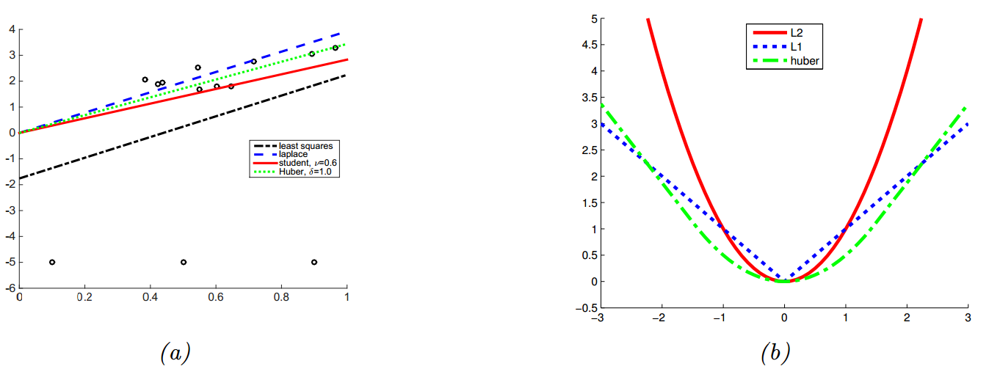

Hình (a) mô tả cách hoạt động Huber loss, nó cho kết quả tương tự so với Laplace likelihood và Stduent Likelihood, kết quả của Least square linear regression khi có outliers

Hình (b) mô tả cách hoạt đọng Huber loss ($\delta =1.5)$ so với L1 loss và L2 loss

### 4.4 RANSAC
**RANSAC** (random sample consensus - sự đồng thuận của các mẫu ngẫu nhiên)

Trước hết, ta giả sử tất cả các điểm đều là inliers, và tính toán $\mathbf w_0$, với mỗi vòng lặp $t$, chúng ta xác định các outliers là các điểm có khoảng cách lớn so với model $\hat {\mathbf w}_t$, rồi loại bỏ chúng ra khỏi model, rồi tính toán trên các điểm còn lại để có $\hat {\mathbf w}_{t+1}$

Cách làm này có thể khiến cho bài toán nonconvex (không lồi), tuy nhiên nó được chứng minh sẽ nhanh chóng hội tụ nếu có một số giả định hợp lí

## 5) Bayesian Linear Regression
Chúng ta đã biết cách tính MLE và MAP estimate cho bài toán linear regression dưới nhiều xác suất tiền nghiệm khác nhau. Trong phần này chúng ta sẽ tính xác suất hậu nghiệm $p(\mathbf w|\mathcal D)$. Để cho đơn giản, ta giả sử phương sai đã biết, bài toán trở nên là $p(\mathbf w|\mathcal D,\sigma^2)$

### 5.1 Tính xác suất hậu nghiệm
Ta có xác suất tiền nghiện, sử dụng phân phối Gaussian
$$p(\mathbf w)=\mathcal N(\mathbf w|\breve {\mathbf w}, \breve {\mathbf \Sigma})$$
Chúng ta có thể viết lại hàm likelihood theo MVN như sau: $$p(\mathcal D| \mathbf w,\sigma^2)=\prod_{n=1}^N p(y_n|\mathbf w^{\mathrm T}\mathbf x,\sigma^2)=\mathcal N(\mathbf y|\mathbf {Xw},\sigma^2 \mathbf I_N)$$
với $\mathbf I_N$ là ma trận đơn vị cấp $N$. Sử dụng công Bayes cho Gauss, ta được
$$p(\mathbf w|\mathbf X,\mathbf y,\sigma^2)\propto \mathcal N(\mathbf w|\breve {\mathbf w}, \breve {\mathbf \Sigma})\mathcal N(\mathbf y|\mathbf {Xw},\sigma^2 \mathbf I_N)=\mathcal N(\mathbf w|{\mathbf w}',  {\mathbf \Sigma}')$$

với $\mathbf w'\overset{\triangle}{=}\mathbf \Sigma' \left(\breve{\mathbf \Sigma}^{-1}\breve{\mathbf w}+\frac{1}{\sigma^2}\mathbf X ^{\mathrm T}\mathbf y\right)$ là giá trị trung bình hậu nghiệm, và $\Sigma' \overset {\triangle}{=}\left(\breve{\mathbf \Sigma}^{-1} +\frac{1}{\sigma^2}\mathbf X^{\mathrm T}{\mathbf X} \right)^{-1}$

Trong trường hợp $\breve {\mathbf w}=0$ và $\breve {\mathbf \Sigma}=\tau^2 \mathbf I$ thì giá trị trung bình của hậu nghiệm sẽ trở thành, $\mathbf w'=\frac{1}{\sigma^2}{\mathbf \Sigma}'\mathbf X^{\mathrm T}\mathbf y$. Đặt $\lambda=\frac{\sigma^2}{\tau^2}$, nó sẽ trở thành ridge regression estimate, $\mathbf w'=(\lambda\mathbf I+\mathbf X^T\mathbf X)^{-1}\mathbf X\mathbf y$




### 5.2 Tính toán phân phối dự đoán hậu nghiệm
Chúng ta đã tính được xác suất hậu nghiệm $p(\mathbf w|\mathcal D)$. Còn niềm tin về những dữ đoán của output tương lai như sao? 
$$p(y|\mathbf x,\mathcal D, \sigma^2)=\int \mathcal N(y|\mathbf x^{\mathrm T}\mathbf w,\sigma^2)\mathcal N(\mathbf w|{\mathbf w}',{\mathbf \Sigma})'d\mathbf w =\mathcal N(y|(\mathbf {w'})^{\mathrm T}\mathbf x, (\sigma'){^2}(\mathbf x))$$
trong đó, $(\sigma'){^2}(\mathbf x)\overset{\triangle}{=}\sigma^2+\mathbf x^{\mathrm T}\mathbf \Sigma'\mathbf x$, được gọi là phương sai của phân phối dự đoán hậu nghiệm sau train $N$ mẫu

Ta có thể làm như sau, tính $\hat{\mathbf w}$ thông qua MLE hoặc MAP estimate, và sau đó bỏ qua hậu nghiệm không chắc chắn bằng cách giả sử $$ p(\mathbf w|\mathcal D)=\delta (\mathbf w - \hat{\mathbf w})$$ Trong trường hợp này,
$$p(y|\mathbf x,\mathcal D,\mathbf \sigma^2)=\int p(y|\mathbf x, \mathbf w) \delta (\mathbf w - \hat{\mathbf w})d\mathbf w=p(y|\mathbf x,\hat{\mathbf w})$$

#III/ Logistic Regression 

## 1) Binary Logistic Regression


### 1.1 Xây dựng Model


- Hàm Sigmoid: $\sigma \left ( x \right )\overset{\underset{\mathrm{\Delta }}{}}{=}\frac{1}{1+e^{-x}}$

  Tính chất thông dụng:
    + Miền giá trị: [0, 1]
    + Đạo hàm dễ tìm: $\frac{d}{dx}\sigma (x)=\sigma (x)(1-\sigma (x))$

  Đồ thị:

    ![An Image](https://upload.wikimedia.org/wikipedia/commons/thumb/8/88/Logistic-curve.svg/480px-Logistic-curve.svg.png)

  Nguồn: https://en.wikipedia.org/wiki/Sigmoid_function
- Phân phối Bernoulli: $p(y)=Ber(y|\lambda )=\lambda^{y}(1-\lambda)^{1-y}$

  trong đó $p(y=1)=\lambda$ và $p(y=0)=1-\lambda$
- Model cho bài toán: $p(y|x,\theta )=Ber(y|\sigma (f(x,\theta)))$
  
  Nhằm đơn giản hoá model, ta có thể sử dụng hàm tuyến tính $f(x,\theta)=w^{T}x+b$


### 1.2 Maximum Likelihood Estimation
- Xác định hàm mất mát (Loss function):
  + Mục đích: Lựa chọn tham số $\theta$ để $p(y|X,\theta)$ đạt giá trị lớn nhất
  + Không ảnh hưởng đáng kể đến kết quả bài toán, ta giả sử các điểm dữ liệu luôn độc lập với nhau với mọi $\theta$
  + Khi đó, 
  $$p(y|X,\theta)=\prod_{n=1}^{N}p(y_{n}|x_{n},\theta)$$
  $$\Leftrightarrow p(y|X,\theta)=\prod_{n=1}^{N}Ber(y_{n}|\mu _{n})$$
  trong đó $\mu _{n}=\sigma(w^{T}x_{n}+b)$
  + Để thuận tiền cho việc tối ưu và phù hợp với ý nghĩa của hàm mất mát, ta biến đổi hàm trên thành 
  $$L(\theta)=-log[p(y|X,\theta)]$$
  $$\Leftrightarrow L(\theta)=-\sum_{n=1}^{N}\left [ y_{n}log\mu _{n}+(1-y_{n})log(1-\mu _{n}) \right ]$$
- Tối ưu:
  + Bằng kiến thức toán học, ta có thể tính được Gradient và Hessian như sau:
    + Gradient:
$g(\theta)=\bigtriangledown _{\theta}L(\theta)=\sum_{n=1}^{N}(\mu _{n}-y_{n})x_{n}$
    + Hessian: $H(\theta)=\bigtriangledown _{\theta}\bigtriangledown _{\theta}^{T}L(\theta)=X^{T}SX$

  trong đó
  
  $X =
 \begin{bmatrix}
  x_{1} & x_{2} & \cdots & x_{N} \\
 \end{bmatrix}$ là ma trận dữ liệu với mỗi điểm dữ liệu là một vector cột
  
  $y=\begin{bmatrix}
y_{1}\\ 
...\\ 
y_{N}
\end{bmatrix}$ là vector cột biểu thị truth label cho từng điểm dữ liệu

  $S\overset{\underset{\mathrm{\Delta }}{}}{=}diag(\mu _{1}(1-\mu _{1}),...,\mu _{n}(1-\mu _{n}))$

    + $L$ có đúng một điểm có giá trị nhỏ nhất

      Thật vậy, ta thấy $H$ là ma trận xác định dương, bởi với mọi vector $v$ khác $0$, ta luôn có 
      $$v^{T}X^{T}SXv=(v^{T}X^{T}S^{\frac{1}{2}})(S^{\frac{1}{2}}Xv)=\left | \left | v^{T}X^{T}S^{\frac{1}{2}} \right | \right |_{2}^{2}>0$$
    + Tìm nghiệm:
      + Gradient Descent (Stochastic) 
$$\theta_{t+1}=\theta_{t}-\eta _{t}(\mu _{n}-y_{n})x_{n}$$
      + Newton's Method  (very steep $\rightarrow $ small step, very flat $\rightarrow $ large step)
$$\theta_{t+1}=\theta_{t}-\eta _{t}H^{-1}(\theta_{t})g(\theta_{t})$$
     Vì $L$ chỉ có đúng một điểm có giá trị nhỏ nhất nên hai phương pháp trên luôn cho nghiệm tối ưu


#### Gradient Descent

In [ ]:
!git clone https://github.com/PBiedenkopf/ML-Logistic-Regression-for-Binary-Classification.git

Cloning into 'ML-Logistic-Regression-for-Binary-Classification'...
remote: Enumerating objects: 33, done.
remote: Counting objects: 100% (33/33), done.
remote: Compressing objects: 100% (23/23), done.
remote: Total 33 (delta 11), reused 29 (delta 7), pack-reused 0
Unpacking objects: 100% (33/33), done.


In [ ]:
""" 
    Linear logistic regression suitable for large datasets
    P. Biedenkopf - 16.12.2020

"""

import numpy as np
import matplotlib.pyplot as plt
import scipy.optimize as opt
import logging
import time 

logging.basicConfig(filename="ERROR.log",
                    filemode='w',
                    level=logging.ERROR)
def sigmoid(z):
    """
        Returns value of the sigmoid function for z
    """
    return 1 / (1 + np.exp(-z));
  
class LinearLogisticRegression:
    """ 
        Logistic regression class.
        members: 
            verbose     -   bool for getting detailed output
            costHist    -   Objective function history list
            method      -   optimization algorithm
            OptMaxIter  -   Max iteration number
            ftol        -   Stop criterion for optimization algorithm
            iter        -   Current iteration, is initialized as 0
            X           -   dataset for which a value gets predicted by the model
            y           -   labels of dataset (vector)
    """
    def __init__(self, X, y, method='L-BFGS-B', optMaxIter=300, verbose=False, ftol=1e-7):
        self.X = np.insert(X, 0, np.ones(len(y)), axis=1) # leading ones-vector for constant term theta0
        self.y = y
        self.optMaxIter = optMaxIter
        self.costHist = []
        self.iter = 0
        self.verbose = verbose
        self.ftol = ftol
        self.method = method
        self.logger = logging.getLogger()
        
    def train(self):
        """ 
            Trains the model for the dataset given in constructor.
        """
        # initialize theta
        self.theta = np.zeros(self.X.shape[1])
        
        opts = {'disp': False, 'maxiter': self.optMaxIter, 'ftol': self.ftol}
        sol = opt.minimize(self.costFun, self.theta, method=self.method, jac=self.costFunGrad, options=opts)
        if sol.success:
            print("Optimization succeeded: {} | Solution: {:e} | {}".format(sol.success, sol.fun, sol.x))
            self.theta = np.array(sol.x)
            self.accuracy()

        if self.verbose:
            self.plotConvergence()
            print(f'Model accuracy is: {self.acc:.1f}% on training data')
            
            
    def predict(self, x):
        """ 
            Predicts value for a given datapoint x.
            variables: 
                t - datapoint for which a value gets predicted by the model
        """
        x = np.insert(x, 0, 1)
        prob = sigmoid(x.dot(self.theta));
        if self.verbose:
            print(f'Prediction for {x[1:]} is: {100*prob:.1f}%')
        return prob
    
    def accuracy(self, threshold=0.5):
        """ 
            Computes the accuracy of the trained model for the training set.
            variables: 
                threshold - threshold for accepting a value as 1
        """
        p = np.zeros([len(self.y), ]);
        for i in range(len(self.y)):
            if sigmoid(self.X[i].dot(self.theta)) >= threshold:
                p[i] = 1;
            else:
                p[i] = 0;
                
        self.acc = np.mean(p == self.y) * 100
    
    def costFun(self, theta):
        """
                Returns objective value for measuring fitness of model.
                variables: 
                    theta   - current model parameters
        """
        if self.verbose:
            print("Iter: {} | theta: {}".format(self.iter, theta))
            self.plotDecisionBoundary2D()
        J = 0
        m = len(self.y)
        # Using np.finfo(float).eps to avoid dividing by zero errors/warnings
        cost = -self.y*np.log(sigmoid(self.X.dot(theta))+np.finfo(float).eps) - (np.ones([m,])-self.y)*np.log(1-sigmoid(self.X.dot(theta))+np.finfo(float).eps)
        J = 1/m * sum(cost)
        
        self.costHist.append(J)
        self.theta = theta
        self.iter += 1
        
        time.sleep(1)
        return J
    
    def costFunGrad(self, theta):
        """
                Returns gradient of the objective.
                variables: 
                    theta   - current model parameters
        """
        Grad = np.zeros(theta.shape);
        m = len(self.y)
        
        for i in range(len(theta)):
            Grad[i] = 1/m * sum( (sigmoid(self.X.dot(theta)) - self.y) * self.X[:,i] )
            
        return Grad
    def costFunHessian(self, theta):
        Hess = np.zeros(theta.shape)
        m = len(self.y)                                      
        for i in range(len(theta)):
            Hess[i] = 1/m * sum                       
            Hess[i] = (1.0/m * np.dot(xTrans, x) * np.diag(sig) * np.diag(1 - sig) )   
        return result
    
    def plotConvergence(self):
        """
            Plots the convergence of the model over the iterations
        """
        plt.figure(2)
        plt.plot(range(0,len(self.costHist)), self.costHist)
        plt.grid(True)
        plt.xlabel("Iteration")
        plt.ylabel("Objective")
        plt.title("Convergence")
        plt.legend()
        
    def plotDecisionBoundary2D(self):
        """
            Plots the dataset and the decision boundary of the model
        """
        try:
            assert self.X.shape[1] == 3 # Method only valid for 2D problems
        except:
            self.logger.error("plotDecisionBoundary2D() method is only valid for 2-dimensional problems!")
            logging.shutdown()
            raise AssertionError("plotDecisionBoundary2D() method is only valid for 2-dimensional problems!")
            
        plt.figure(3)
        X1 = self.X[:,1]
        X2 = self.X[:,2]
        pos = np.where(self.y == 1)
        neg = np.where(self.y == 0)
        plt.scatter(X1[pos], X2[pos], label='positive', marker='.', color='b')
        plt.scatter(X1[neg], X2[neg], label='negative', marker='+', color='r')
        plt.xlabel(r'$X_2$')
        plt.ylabel(r'$X_1$')
           
        # decision boundary
        x = np.linspace(np.amin(X1), np.amax(X1))
        y = (-1/self.theta[2])*(self.theta[1]*x + self.theta[0])
        plt.plot(x, y, label="Decision Boundary", color='black')
        plt.show()
        
    def __str__(self):
        return "Logistic Regression with regularisation: {} and max. {} Iterations.".format(self.Lambda, self.optMaxIter)


Iter: 0 | theta: [0. 0. 0.]


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:170: RuntimeWarning: divide by zero encountered in double_scalars
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:170: RuntimeWarning: invalid value encountered in multiply


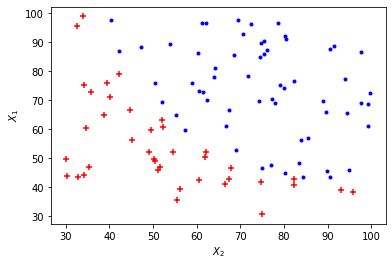

Iter: 1 | theta: [0.00622828 0.72261903 0.69121845]


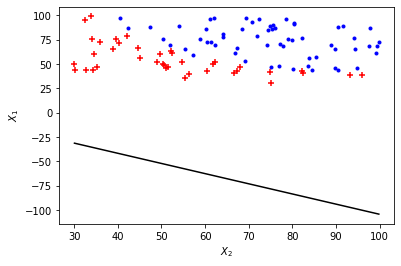

Iter: 2 | theta: [0.00131354 0.15239939 0.14577705]


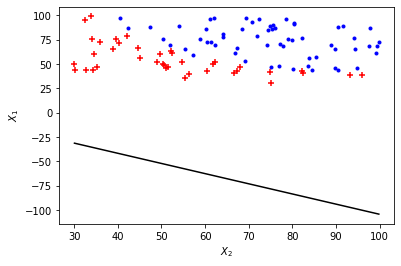

Iter: 3 | theta: [0.00014556 0.01688845 0.01615458]


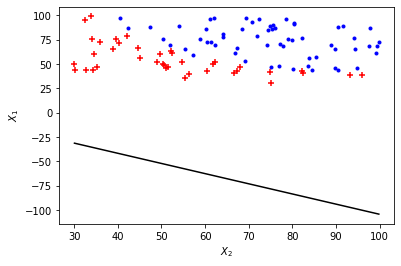

Iter: 4 | theta: [4.90859171e-05 5.69505791e-03 5.44758578e-03]


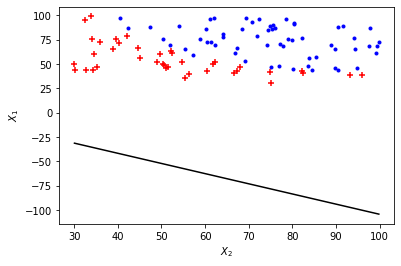

Iter: 5 | theta: [1.68755257e-05 5.83376498e-03 5.34928501e-03]


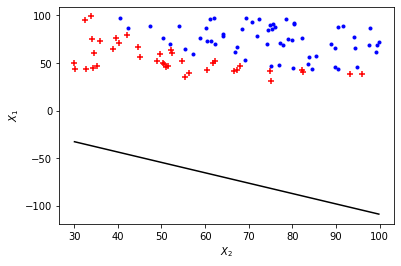

Iter: 6 | theta: [-0.00011197  0.00638859  0.00495608]


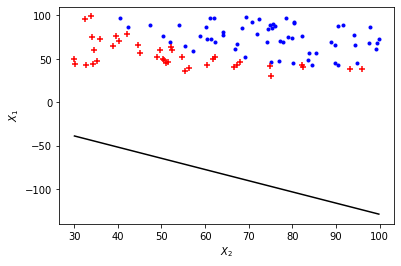

Iter: 7 | theta: [-0.00076045  0.00863338  0.0028439 ]


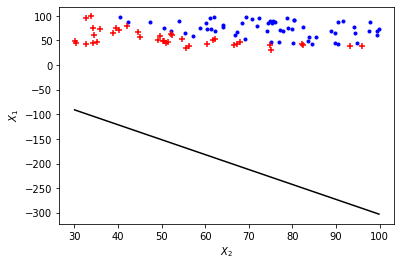

Iter: 8 | theta: [-0.0015367   0.00911463  0.00216304]


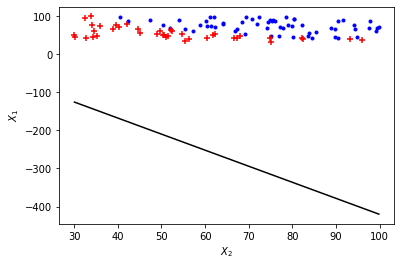

Iter: 9 | theta: [-0.00223558  0.00927408  0.00186186]


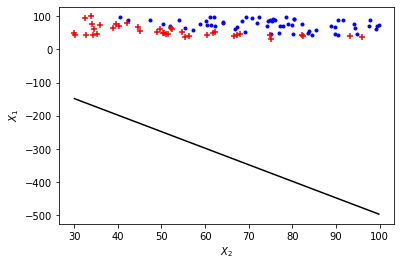

Iter: 10 | theta: [-0.00310562  0.00934758  0.00169727]


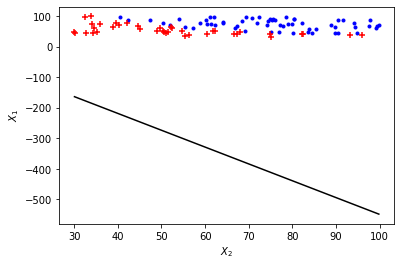

Iter: 11 | theta: [-0.00654433  0.00951185  0.00134065]


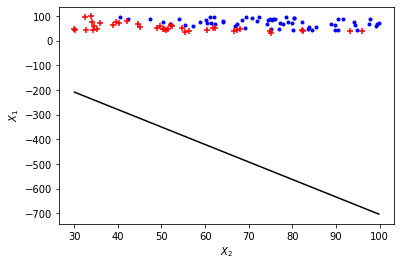

Iter: 12 | theta: [-0.01489078  0.00976274  0.00086772]


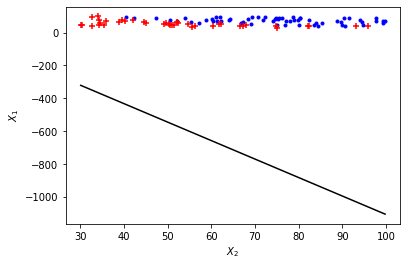

Iter: 13 | theta: [-0.03847189  0.01024936  0.00014411]


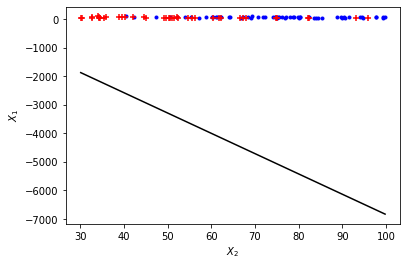

Iter: 14 | theta: [-0.09999978  0.01117718 -0.00079203]


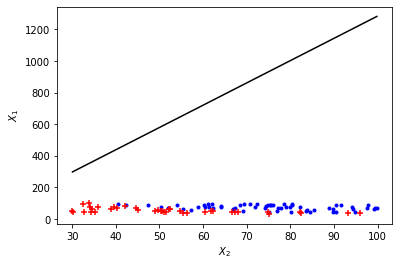

Iter: 15 | theta: [-0.26254133  0.01308852 -0.0017527 ]


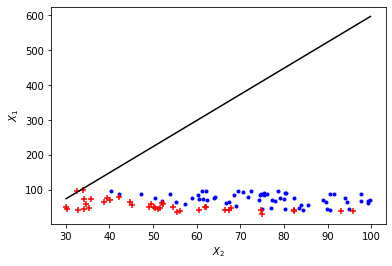

Iter: 16 | theta: [-0.67715986  0.01716294 -0.00185686]


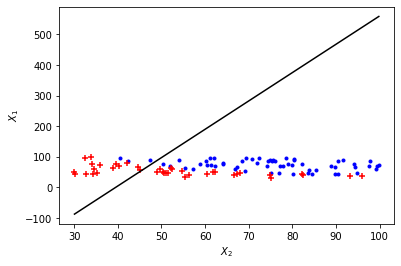

Iter: 17 | theta: [-1.67283710e+00  2.58416816e-02  1.40141758e-03]


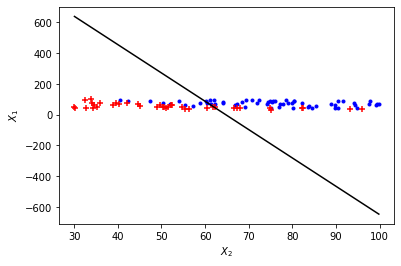

Iter: 18 | theta: [-3.72101526  0.04225084  0.01299595]


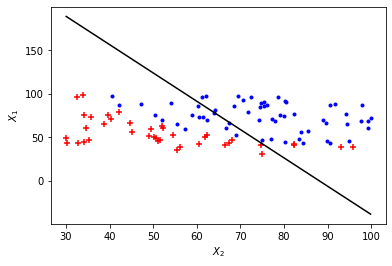

Iter: 19 | theta: [-6.93319003  0.06728101  0.03620863]


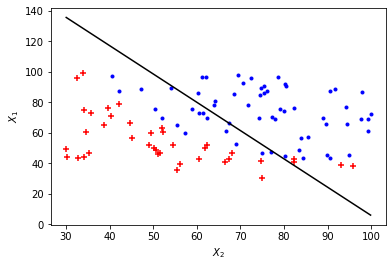

Iter: 20 | theta: [-10.49671442   0.08585821   0.07340119]


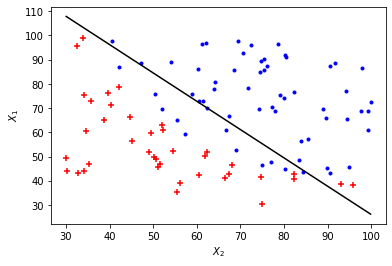

Iter: 21 | theta: [-14.4380081    0.13193808   0.09651874]


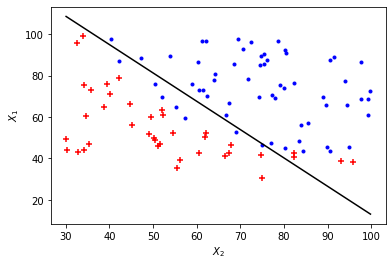

Iter: 22 | theta: [-17.06225149   0.14860366   0.12389109]


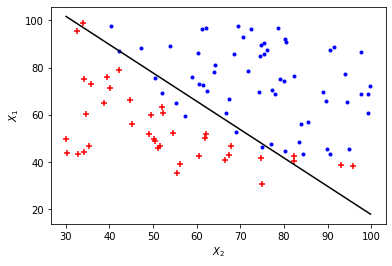

Iter: 23 | theta: [-20.62960087   0.17115859   0.16150456]


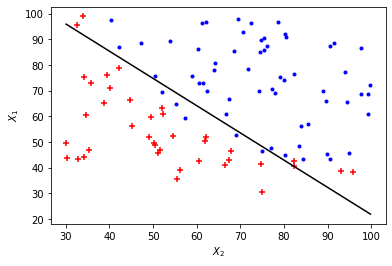

Iter: 24 | theta: [-22.67742089   0.18558129   0.18180804]


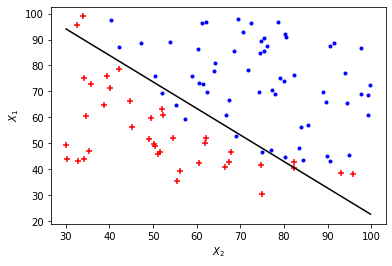

Iter: 25 | theta: [-23.90623526   0.19487198   0.19315604]


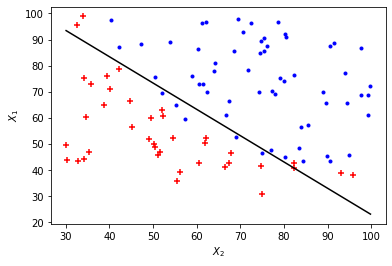

Iter: 26 | theta: [-24.5330622    0.19987517   0.19819925]


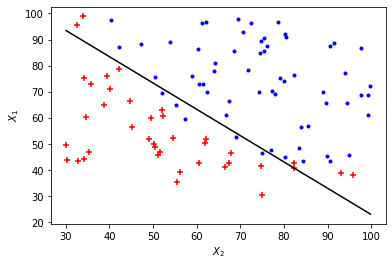

Iter: 27 | theta: [-24.28473238   0.19555412   0.186812  ]


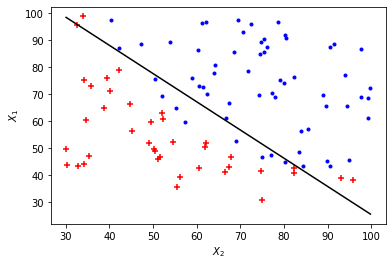

Iter: 28 | theta: [-24.52789888   0.19978533   0.19796248]


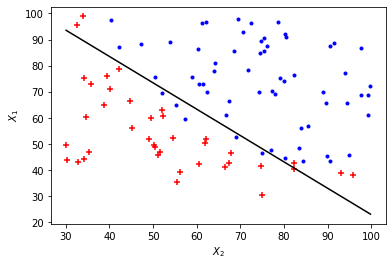

Iter: 29 | theta: [-24.85023875   0.20274719   0.20018443]


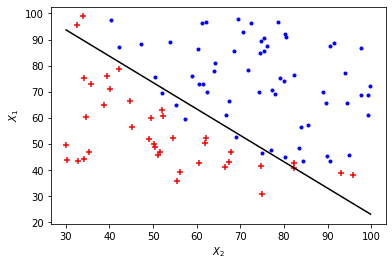

Iter: 30 | theta: [-24.8771594    0.20340071   0.19997593]


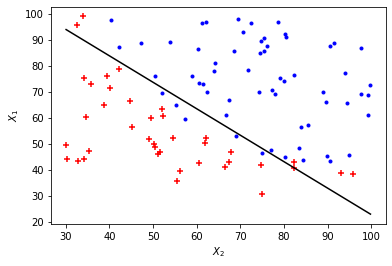

Iter: 31 | theta: [-24.87128702   0.2033924    0.19989288]


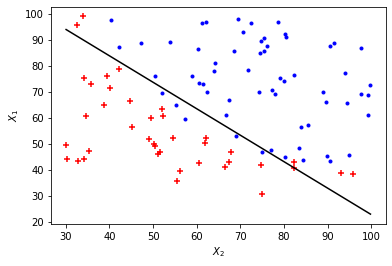

Optimization succeeded: True | Solution: 2.045574e-01 | [-24.87128702   0.2033924    0.19989288]
Model accuracy is: 88.9% on training data
Prediction for [50 85] is: 90.8%


0.9079809181122837

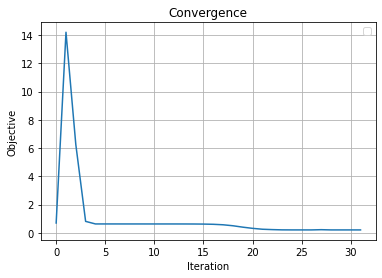

In [ ]:
# Manufacturing quality testing dataset
dataset = '/content/ML-Logistic-Regression-for-Binary-Classification/datasets/dataset.csv'
data = np.genfromtxt(dataset, delimiter=',', skip_header=1)
y = data[:,2]
X = data[:,:2]

# Create algorithm instance
model = LinearLogisticRegression(X, y, verbose=True, method='L-BFGS-B')

# Fit model with training data
model.train()
#model.plotDecisionBoundary2D()

# Make prediction for new datapoint
pred = [50, 85]
model.predict(pred)

#### Newton Method





/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:232: RuntimeWarning: divide by zero encountered in double_scalars
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:232: RuntimeWarning: invalid value encountered in multiply


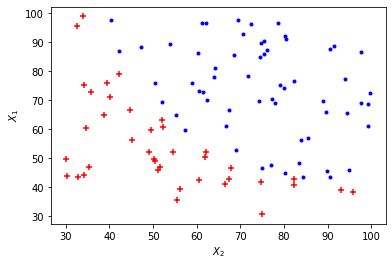

Iteration #:        1.  Cost: +0.3315


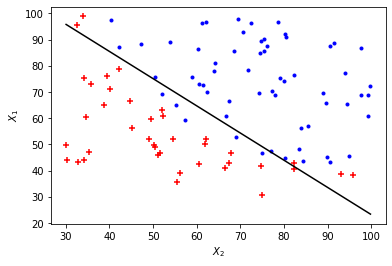

Iteration #:        2.  Cost: +0.2484


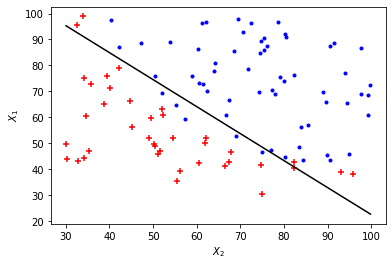

Iteration #:        3.  Cost: +0.2147


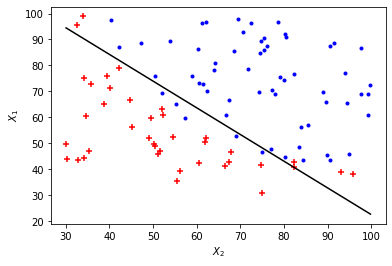

Iteration #:        4.  Cost: +0.2055


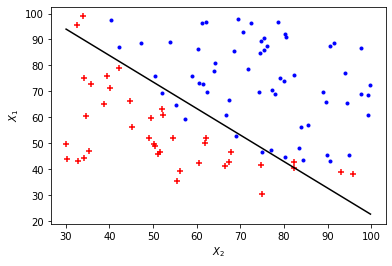

Iteration #:        5.  Cost: +0.2046


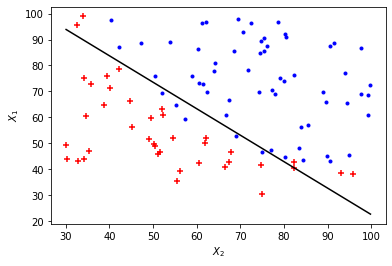

Iteration #:        6.  Cost: +0.2046


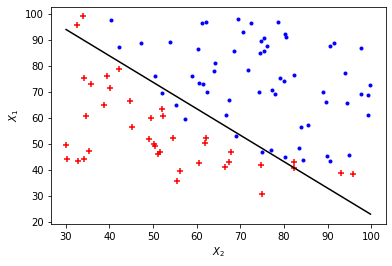

Iteration #:        7.  Cost: +0.2046.
Finished because cost function tolerance reached. Using newton optimisation method.
LOGISTIC REGRESSION USING NEWTON TERRMINATION RESULTS
Initial Weights were:             0.0, 0.0, 0.0.
   With initial cost:       +0.693147.
        # Iterations:              +7.    
       Final weights:    theta0:-24.87, theta1:+0.20, theta02:+0.200.
          Final cost:       +0.204557.


In [ ]:
import numpy as np

from sklearn import datasets
from sklearn.linear_model import LogisticRegression as sklearnLogisticRegression

class LogisticRegression:
    """
            Purpose: To estimate Logistic regression parameters in Python.
            Inputs:
                alpha           : Is the optimisation learning rate.
                maxIterations   : Maximum number of iterations for optimisation routine..
                fitIntercept    : Include the intercept in the model fit.
                verbose         : Display program information.
                optimisation    : The optimisation routine to use. Options are:
                                            gradientAscent
                                            newton
    """
    def __init__(self,X, y, alpha=0.01, maxIterations=100000, fitIntercept=True, verbose=False,optimisation="gradientAscent"):
        self.X = np.insert(X, 0, np.ones(len(y)), axis=1) # leading ones-vector for constant term theta0
        self.y = y
        self.alpha = alpha
        self.maxIterations = maxIterations  # Maximum number of times to run the optimisation.
        self.numIterations = 0;             # Record the number of iterations performed.
        self.hasConverged = False;          # This variable is used to terminate the iterations searching for optimum parameters.
        self.fitIntercept = fitIntercept
        self.verbose = verbose
        self.costHistory = [];
        self.tolerance = tol=1e-7; # convergence tolerance;
        self.theta=[];
        self.optimisation = optimisation;

    def __add_intercept(X):
        intercept = np.ones((X.shape[0], 1))
        return np.concatenate((intercept, X), axis=1)

    def __sigmoid(z):
        return 1 / (1 + np.exp(-z))


    def __cost(self, X, y, theta):
        # Purpose: Logistic regression log cost function.
        z = np.dot(X, theta)
        p = LogisticRegression.__sigmoid(z)
        return (-y * np.log(p) - (1 - y) * np.log(1 - p)).mean()

    def gradientAscent(X,y,theta,alpha):
        z = np.dot(X, theta)
        p = LogisticRegression.__sigmoid(z)
        gradient = np.dot(X.T, (p - y)) / y.size;  # 1st derivative of log likelihood wrt parameters.
        theta -= alpha * gradient  # Update the parameters.

        return theta;

    def newton(X,y,theta,useRegulisation=False,regulisationParameter=0):
        """ Newton optimisation method."""
        z = np.dot(X, theta)
        p = LogisticRegression.__sigmoid(z)
        W = np.diag(p * (1 - p))
        hessian = X.T.dot(W).dot(X);

        gradient = np.dot(X.T, (y-p));  # 1st derivative of log likelihood wrt parameters.

        try:
            if useRegulisation:
                step = np.dot(np.linalg.inv(hessian + regulisationParameter * np.eye(theta)), grad)
            else:
                step = np.dot(np.linalg.inv(hessian), gradient)
        except np.linalg.LinAlgError:
            step=0;

        ## update the weights
        theta = theta + step


        return theta;

    def fit(self, X, y):
        if self.fitIntercept:
            X = LogisticRegression.__add_intercept(X=X)


        self.theta = np.zeros(X.shape[1]);  # Initialise weights.
        alpha=self.alpha;

        cost = self.__cost(X, y, self.theta);  # Calculate the cost.
        self.costHistory.append(cost);  # Record the intitial cost for plotting.


        iterCount=0;

        while not self.hasConverged:
            # Perform the optimisation many times to reduce the cost by improving the parameters.
            iterCount+=1;                       # Counter for the number of optimisation iterations.

            # Depending on the optimisation approach. Calculate the coeffient update step differently.
            if self.optimisation=="gradientAscent":
                theta = LogisticRegression.gradientAscent(X,y,self.theta,self.alpha)
                iterDisplayVerbose = 10000;
            elif self.optimisation=="newton":
                theta = LogisticRegression.newton(X, y, self.theta)
                iterDisplayVerbose = 1;             # The number of iteration steps is significantly less than Gradient Ascent.
            else:
                assert "unknown optimisation routine."
                return;

            cost = self.__cost(X,y, theta);     # Calculate the cost.

            self.plotDecisionBoundary2D()
            if iterCount>1:
            # Only check to terminate optimisation after performing the second optimisation calculation.
                hasConverged = self.__checkConvergence(self.costHistory[-1], cost, self.tolerance,iterCount);  # Check if should terminate iteration updates as convergence tolerance has been reached.

                if hasConverged.hasConverged==True:
                    print("Iteration #:  {:>7,.0f}.  Cost: {:>+7.4f}.".format(iterCount, cost));
                    print("Finished because {}. Using {} optimisation method.".format(hasConverged.reason, self.optimisation));
                    self.numIterations = iterCount;
                    self.hasConverged == True;

                if (self.verbose == True and iterCount % iterDisplayVerbose == 0) and  hasConverged.hasConverged==False:
                    # Print out the log output.
                    print("Iteration #:  {:>7,.0f}.  Cost: {:>+7.4f}".format(iterCount, cost));


            if iterCount < 2:

                if (self.verbose == True and iterCount % iterDisplayVerbose == 0):
                    # Print out the log output.
                    print("Iteration #:  {:>7,.0f}.  Cost: {:>+7.4f}".format(iterCount, cost));

                self.theta = theta;
                self.costHistory.append(cost);  # Record the cost for plotting.
            else:
                if not (((self.optimisation == "newton") and (cost > self.costHistory[-1])) or (np.isnan(cost))) or iterCount<1:
                    # The Newton method on the last step can give coefficients well off and a worse cost as close to the singularity.
                    # Because of this. Not recording the last theta and cost found in this case and using the previous one.
                    self.theta = theta;
                    self.costHistory.append(cost);  # Record the cost for plotting.


    def __checkConvergence(self,previousCost, cost, tolerance, iterCount):
        ''' Purpose: Checks if coefficients have converged.
            Returns True if they have converged, False otherwise.'''
        costChange = np.abs(previousCost - cost)

        self.reason="";
        self.hasConverged=False;
        if (np.any(costChange < tolerance)):
            self.reason = "cost function tolerance reached";
            self.hasConverged = True;

        # If havn't reached thresholds, perform more iterations (keep training).
        if (iterCount > self.maxIterations):
            self.reason="maximum iterations reached"
            self.hasConverged = True;


        if (self.optimisation == "newton"):
            if (np.isnan(cost)):
                # The Newton method on the last step can give coefficients well off and a worse cost as close to the singularity.
                # Because of this. Not recording the last theta and cost found in this case and using the previous one.
                self.reason="singular Hessian"
                self.hasConverged = True;
            elif (cost > previousCost):
                # The Newton method on the last step can give coefficients well off and a worse cost as close to the singularity.
                # Because of this. Not recording the last theta and cost found in this case and using the previous one.
                self.reason="cost function worsoning as close to solution"
                self.hasConverged = True;



        return self


    def predict_prob(X,theta,fitIntercept=True):
        if fitIntercept:
            X = LogisticRegression.__add_intercept(X=X)

        return LogisticRegression.__sigmoid(np.dot(X, theta))

    def predict(self, X):
        return LogisticRegression.predict_prob((X).round(),self.theta,self.fitIntercept)


    def formattedOutput(objLogisticRegression):
        """
        Purpose: To produce readable output summary of the results.
            Input:
                LogisticRegression  : A class instance containing the fitted information.
        """
        optimisationMethod=objLogisticRegression.optimisation;
        theta=objLogisticRegression.theta;
        inititialCost=objLogisticRegression.costHistory[0];
        finalCost=objLogisticRegression.costHistory[-1];
        numIterations=objLogisticRegression.numIterations;


        dash = '=' * 80; #chr(10000)*50
        print(dash)
        print("LOGISTIC REGRESSION USING {0} TERRMINATION RESULTS".format(optimisationMethod.upper()))
        print(dash)
        print("Initial Weights were:    {:>12.1f}, {:>2.1f}, {:>2.1f}.".format(0, 0, 0))
        print("   With initial cost:    {:>+12.6f}.".format(inititialCost))
        print("        # Iterations:    {:>+12,.0f}.    ".format(numIterations))
        print("       Final weights:    theta0:{:>+0.2f}, theta1:{:>+3.2f}, theta02:{:>+3.3f}.".format(
            theta[0], theta[1], theta[2]))#print("       Final weights:    \u03F4\u2080:{:>+0.2f}, \u03F4\u2081:{:>+3.2f}, \u03F4\u2082:{:>+3.3f}.".format(theta[0], theta[1], theta[2]))
        print("          Final cost:    {:>+12.6f}.".format(finalCost))
        print(dash)

    def plotDecisionBoundary2D(self):
        """
            Plots the dataset and the decision boundary of the model
        """
        # try:
        #     assert self.X.shape[1] == 3 # Method only valid for 2D problems
        # except:
        #     self.logger.error("plotDecisionBoundary2D() method is only valid for 2-dimensional problems!")
        #     logging.shutdown()
        #     raise AssertionError("plotDecisionBoundary2D() method is only valid for 2-dimensional problems!")
            
        plt.figure(3)
        X1 = self.X[:,1]
        X2 = self.X[:,2]
        pos = np.where(self.y == 1)
        neg = np.where(self.y == 0)
        plt.scatter(X1[pos], X2[pos], label='positive', marker='.', color='b')
        plt.scatter(X1[neg], X2[neg], label='negative', marker='+', color='r')
        plt.xlabel(r'$X_2$')
        plt.ylabel(r'$X_1$')
           
        # decision boundary
        x = np.linspace(np.amin(X1), np.amax(X1))
        y = (-1/self.theta[2])*(self.theta[1]*x + self.theta[0])
        plt.plot(x, y, label="Decision Boundary", color='black')
        plt.show()






def run():

    # Load Data:
    dataset = '/content/ML-Logistic-Regression-for-Binary-Classification/datasets/dataset.csv'
    data = np.genfromtxt(dataset, delimiter=',', skip_header=1)
    y = data[:,2]
    X = data[:,:2]



    # Run the model:
    objLogisticRegression = LogisticRegression(X,y,alpha=0.1, maxIterations=100000,fitIntercept=True, verbose=True,optimisation="newton");   # Initialise the regression.
    objLogisticRegression.fit(X, y);                                 # Fit the regression.

    # Show the output:
    LogisticRegression.formattedOutput(objLogisticRegression=objLogisticRegression);        # Show the formatted results.



    # # Run the model:
    # objLogisticRegression = LogisticRegression(X,y,alpha=0.1, maxIterations=100000,fitIntercept=True, verbose=True,optimisation="gradientAscent");   # Initialise the regression.
    # objLogisticRegression.fit(X, y);                                 # Fit the regression.

    # # Show the output:
    # LogisticRegression.formattedOutput(objLogisticRegression=objLogisticRegression);        # Show the formatted results.


    # # sklearn's Logistic Regression.
    # model = sklearnLogisticRegression(C=1e8).fit(X, y)
    # dash = '=' * 80;  # '=' * 80;
    # print(dash)
    # print("LOGISTIC REGRESSION USING SKLEARN TERMINATION RESULTS")
    # print("Final weights:    theta0:{:>+0.2f}, theta1:{:>+0.2f}, theta2:{:>+0.2f}.".format(model.intercept_[0], model.coef_[0][0], model.coef_[0][1]))
    # print(dash)



    # print("Finished")





if __name__ == '__main__':
    run()

###(*)Non-linear classifier


Trong nhiều trường hợp, linear classifier sẽ không cho ra được kết quả tốt đối với bài toán cần giải quyết. Khi đó chúng ta có thể cải thiện bằng cách sử dụng polynomial classifier ứng với bậc D:
$$f(x,\theta)=\theta^{T}\phi(x)$$
trong đó 
$\phi(x)=\begin{bmatrix}
1\\ 
x\\ 
x^{2}\\ 
...\\ 
x^{D}
\end{bmatrix}$

Ví dụ:

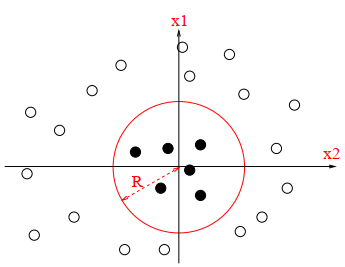

Nguồn:https://probml.github.io/pml-book/book1.html?fbclid=IwAR1o2Yg4GShwlFgMwVANafXtPC0tXNkcnNnQmdKKeApIPx6o_KiftOvX00s

Xét các điểm dữ liệu có dạng $x=(x_{1}, x_{2})$ như hình bên trái

Ta nhận thấy nếu sử dụng linear classifier $f(x,\theta)=w_{0}+w_{1}x_{1}+w_{2}x_{2}$ sẽ không được kết quả tốt bởi dữ liệu không phân tách tuyến tính (linearly separable)

Do đó, ta sẽ sử dụng non-linear classifier đã được giới thiệu trên

Ta chọn $\phi(x)=\begin{bmatrix}
1\\ 
x_{1}^{2}\\ 
x_{2}^{2}
\end{bmatrix}$

Khi đó, ta được $f(x,\theta)=w_{0}+w_{1}x_{1}^{2}+w_{2}x_{2}^{2}$

###1.3 Maximum a posteriori estimation


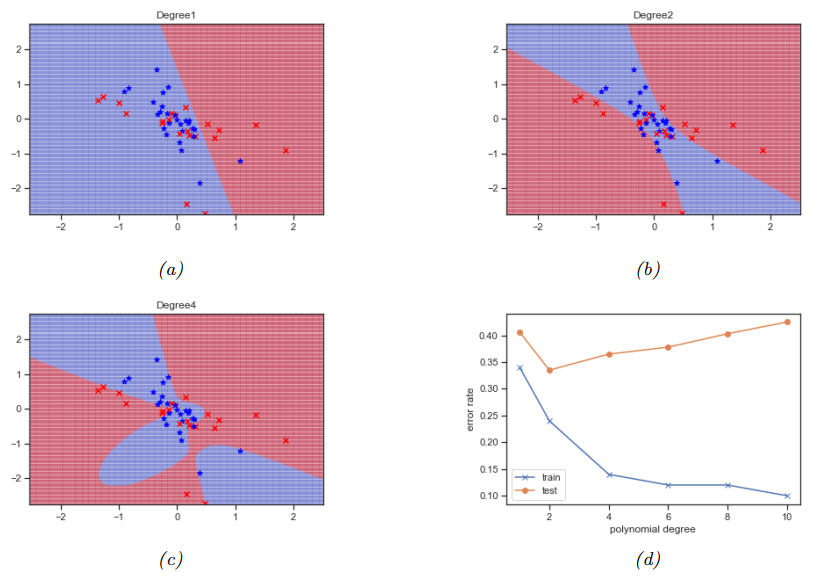

Nguồn:https://probml.github.io/pml-book/book1.html?fbclid=IwAR1o2Yg4GShwlFgMwVANafXtPC0tXNkcnNnQmdKKeApIPx6o_KiftOvX00s
+ Bằng cách sử dụng non-linear classifier và thay đổi hàm $\phi$, ta thu được các kết quả như hình trên.

+ Nhận thấy rằng, nếu số bậc D của hàm $\phi$ càng lớn thì model càng khớp với các điểm dữ liệu được cho. Khi đó, tình trạng Overfitting xảy ra.

+ Để ngăn tình trạng này, ta sẽ thêm vào đại lượng phạt $C(\theta)=-log(p(\theta))$ trong đó $p(\theta)=\mathcal{N}(\theta|0,CI)$

+ Do đó, ta có được hàm mất mát mới:
$$L'(\theta)=NLL(\theta)+C(\theta)$$
$$\Leftrightarrow L'(\theta)=NLL(\theta)+\lambda \left | \left | \theta \right | \right |_{2}^{2}$$
trong đó $\lambda =\frac{1}{C}$

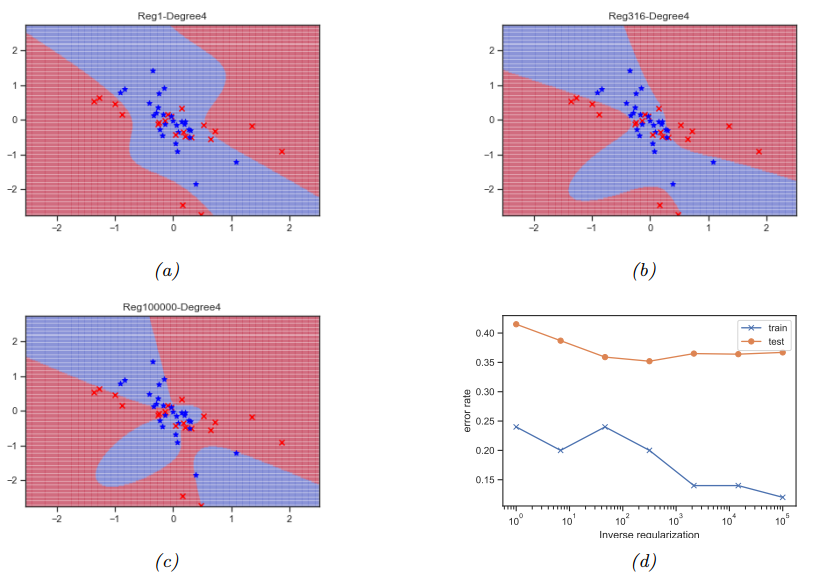

Bằng cách điều chỉnh C, ta có được các kết quả khả quan trên.

In [ ]:
!git clone https://github.com/AakashPaul/Regularized-Logistic-Regression.git

fatal: destination path 'Regularized-Logistic-Regression' already exists and is not an empty directory.


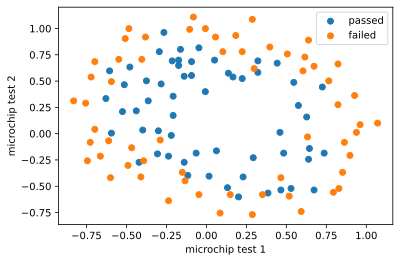

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import scipy.optimize as opt
data=pd.read_csv("/content/Regularized-Logistic-Regression/Data22.txt",header=None)
x=data.iloc[:,0:2]
y=data.iloc[:,2]
data.head()
mask=y==1
passed=plt.scatter(x[mask][0].values,x[mask][1].values)
failed=plt.scatter(x[~mask][0].values,x[~mask][1].values)
plt.xlabel('microchip test 1')
plt.ylabel('microchip test 2')
plt.legend((passed,failed),('passed','failed'))
plt.show()

In [ ]:
#mapfeaturing
#done so that a more accurate decision boundary can be made 
#2 features will not be sufficient as a linear boundary is not required here

def mapFeature(x1,x2):      
    degree=6                                
    out=np.ones(x.shape[0])[:,np.newaxis]
    for i in range(1,degree+1):
        for j in range(i+1):
            out=np.hstack((out,np.multiply(np.power(x1,i-j),np.power(x2,j))[:,np.newaxis]))          
    return out
x=mapFeature(x.iloc[:,0],x.iloc[:,1])
x

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  # Remove the CWD from sys.path while we load stuff.


array([[ 1.00000000e+00,  5.12670000e-02,  6.99560000e-01, ...,
         6.29470940e-04,  8.58939846e-03,  1.17205992e-01],
       [ 1.00000000e+00, -9.27420000e-02,  6.84940000e-01, ...,
         1.89305413e-03, -1.39810280e-02,  1.03255971e-01],
       [ 1.00000000e+00, -2.13710000e-01,  6.92250000e-01, ...,
         1.04882142e-02, -3.39734512e-02,  1.10046893e-01],
       ...,
       [ 1.00000000e+00, -4.84450000e-01,  9.99270000e-01, ...,
         2.34007252e-01, -4.82684337e-01,  9.95627986e-01],
       [ 1.00000000e+00, -6.33640000e-03,  9.99270000e-01, ...,
         4.00328554e-05, -6.31330588e-03,  9.95627986e-01],
       [ 1.00000000e+00,  6.32650000e-01, -3.06120000e-02, ...,
         3.51474517e-07, -1.70067777e-08,  8.22905998e-10]])

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:4: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  after removing the cwd from sys.path.


[[0.69314718]]
[ 1.27271026  0.62529964  1.18111686 -2.01987399 -0.91743189 -1.43166928
  0.12393227 -0.36553118 -0.35725404 -0.17516291 -1.45817009 -0.05098418
 -0.61558555 -0.27469165 -1.19271298 -0.24217841 -0.20603299 -0.04466178
 -0.2777895  -0.29539513 -0.45645981 -1.04319154  0.02779373 -0.29244869
  0.0155576  -0.32742405 -0.14389149 -0.92467488]


[0.52900273]


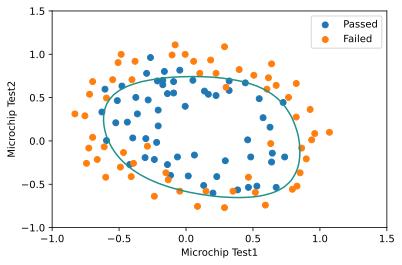

In [ ]:
lamda=1
(m,n)=x.shape
theta=np.zeros((n,1))
y=y[:,np.newaxis]
#defining sigmoid function
def sigmoid(x):
    return 1/(1+np.exp(-x))
#defining Regularized Cost Function
def reg_costFunc(theta, x, y, lamda):
    m=len(y)
    j=(-1/m)*(y.T @ np.log(sigmoid(x@ theta)) + (1 - y.T) @ np.log(1 - sigmoid(x@ theta)))#this is different from earlier cost 
                                                                                          #besause in this case we have to 
                                                                                          #create the result in the form of an
                                                                                          #array so that it can be added to
                                                                                          #regularization term
    reg=(lamda/(2*m))*(theta[1:].T @ theta[1:])
    j=j+reg
    return j

j=reg_costFunc(theta, x, y, lamda)
print(j)
#defining Gradient Descent Function
def lrGradientDescent(theta, x, y, labda):
    m = len(y)
    grad = np.zeros([m,1])
    grad = (1/m) * x.T @ (sigmoid(x @ theta) - y)
    grad[1:] = grad[1:] + (lamda / m) * theta[1:]
    return grad
#Learning parameters using fmin_tnc
output = opt.fmin_tnc(func = reg_costFunc, x0 = theta.flatten(), fprime = lrGradientDescent, \
                         args = (x, y.flatten(), lamda))
theta = output[0]

print(theta)

print("\n")

j=reg_costFunc(theta, x, y, lamda)    
print(j)
# making decision boundary

u = np.linspace(-1, 1.5, 50)
v = np.linspace(-1, 1.5, 50)
z = np.zeros((len(u), len(v)))

def mapFeatureForPlotting(x1, x2):
    degree = 6
    out = np.ones(1)
    for i in range(1, degree+1):
        for j in range(i+1):
            out = np.hstack((out, np.multiply(np.power(x1, i-j), np.power(x2, j))))
    return out

for i in range(len(u)):
    for j in range(len(v)):
        z[i,j]=np.dot(mapFeatureForPlotting(u[i],v[j]),theta)

mask = y.flatten() == 1
x = data.iloc[:,:-1]
passed = plt.scatter(x[mask][0], x[mask][1])
failed = plt.scatter(x[~mask][0], x[~mask][1])
plt.contour(u,v,z,0)
plt.xlabel('Microchip Test1')
plt.ylabel('Microchip Test2')
plt.legend((passed, failed), ('Passed', 'Failed'))
plt.show()

## 2) Mutil Logistic Regression 


### 2.1 Xây dựng Model



Mô hình: $p(C_k|x) = y_k(x, w, \phi(x)) = \frac{e^{a_k}}{\sum_{j=0}^K e^{a_j}}$. 


(Trong đó: 

$K$: số lượng các lớp.
 
$C_k$: lớp thứ $k$.
 
$w$: ma trận kích thước $N*K$, và các logit $a_k = w_k^T\phi(x)$. )


Ở đây, hồi quy logistic nhiều biến đã sử dụng hàm Softmax $S_k = \frac{e^{a_k}}{\sum_{j=0}^K e^{a_j}}$ để ánh xạ các logit $a_k\in\mathbb{R}$ về tập $[0,1]$ thỏa mãn tính chất $\sum_{k=1}^K S_k = 1$.

Với $k = 2$, hàm Softmax chính là hàm Sigmoid:

$$\frac{e^{xa_1}}{e^{xa_1}+e^{xa_2}} = \frac{1}{1+e^{x(a_2-a_1)}}$$

### 2.2 Maximum Likelihood Estimation




$p(C_k|x) = y_k(x, w, \phi(x)) = \frac{e^{a_k}}{\sum_{j=0}^K e^{a_j}}$

$a_k = w_k^T\phi$

Xét tập dữ liệu $X = [x_1, x_2, ..., x_N]$ với các giá trị mục tiêu $t_1, t_2, ..., t_N$, được nhóm lại thành vectơ $t$, trong đó $t_i$ là các vectơ sao cho nếu $x_i = c$, $t_{ic} = 1$, ngược lại $t_{ic} = 0$. 

Ta có hàm khả năng như sau

$$p(t|X,w,\phi) = \prod_{n = 1}^N\prod_{k=1}^Kp(C_k|\phi(x_n))^{t_{nk}}$$

Đặt $y_{nk} = p(C_k|\phi(x_n))$, ta có 

$$p(t|X,w,\phi) = \prod_{n = 1}^N\prod_{k=1}^Ky_{nk}^{t_{nk}}$$

Và hàm $LL(w)$(log-likelihood):

$$LL(w) = ln(p(t|X,w,\phi)) = \sum_{n = 1}^N\sum_{k=1}^Kln(y_{nk})*{t_{nk}}$$

Đặt $w_{ML} = argmax_w(LL(w))$, $w = w_{ML} \Leftrightarrow \nabla_w LL(w) = 0$

Ta tính $\frac{dLL(w)}{dw}$ như sau:

$\nabla_{w_j} LL(w) = \frac{dLL(w)}{dw} = \frac{dLL(w)}{dy}\frac{dy}{da}\frac{da}{dw} =  -\sum_{n = 1}^N\sum_{k=1}^Kt_{nk}\frac{1}{y_{nk}}*y_{nk}(I_{kj}-y_j)*\phi(x_n) = \sum_{n = 1}^N(y_{nj}-t_{nj})\phi(x_n)$

Từ công thức đạo hàm trên, ta có thể dùng SGD để tìm $w_{ML}$ một cách dễ dàng.

$$\nabla_{w_k}\nabla_{w_j}LL(w) = \sum_{n=1}^{N}y_{nk}(I_{kj}-y_{nj})\phi(x_n)\phi(x_n)^T$$

Tính được ma trận Hesse trên, nhận thấy rằng đây là một ma trận xác định âm, suy ra, ta cũng có thể sử dụng thuật toán Newton-Raphson để tìm $w_{ML}$

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

class MultiClassLogisticRegression:
    
    def __init__(self, n_iter = 10000, thres=1e-3):
        self.n_iter = n_iter
        self.thres = thres
    
    def fit(self, X, y, batch_size=64, lr=0.001, rand_seed=4, verbose=False): 
        np.random.seed(rand_seed) 
        self.classes = np.unique(y)
        self.class_labels = {c:i for i,c in enumerate(self.classes)}
        X = self.add_bias(X)
        y = self.one_hot(y)
        self.loss = []
        self.weights = np.zeros(shape=(len(self.classes),X.shape[1]))
        self.fit_data(X, y, batch_size, lr, verbose)
        return self
 
    def fit_data(self, X, y, batch_size, lr, verbose):
        i = 0
        while (not self.n_iter or i < self.n_iter):
            self.loss.append(self.cross_entropy(y, self.predict_(X)))
            idx = np.random.choice(X.shape[0], batch_size)
            X_batch, y_batch = X[idx], y[idx]
            error = y_batch - self.predict_(X_batch)
            update = (lr * np.dot(error.T, X_batch))
            self.weights += update
            if np.abs(update).max() < self.thres: break
            if i % 1000 == 0 and verbose: 
                print(' Training Accuray at {} iterations is {}'.format(i, self.evaluate_(X, y)))
            i +=1
    
    def predict(self, X):
        return self.predict_(self.add_bias(X))
    
    def predict_(self, X):
        pre_vals = np.dot(X, self.weights.T).reshape(-1,len(self.classes))
        return self.softmax(pre_vals)
    
    def softmax(self, z):
        return np.exp(z) / np.sum(np.exp(z), axis=1).reshape(-1,1)

    def predict_classes(self, X):
        self.probs_ = self.predict(X)
        return np.vectorize(lambda c: self.classes[c])(np.argmax(self.probs_, axis=1))
  
    def add_bias(self,X):
        return np.insert(X, 0, 1, axis=1)
  
    def get_randon_weights(self, row, col):
        return np.zeros(shape=(row,col))

    def one_hot(self, y):
        return np.eye(len(self.classes))[np.vectorize(lambda c: self.class_labels[c])(y).reshape(-1)]
    
    def score(self, X, y):
        return np.mean(self.predict_classes(X) == y)
    
    def evaluate_(self, X, y):
        return np.mean(np.argmax(self.predict_(X), axis=1) == np.argmax(y, axis=1))
    
    def cross_entropy(self, y, probs):
        return -1 * np.mean(y * np.log(probs))

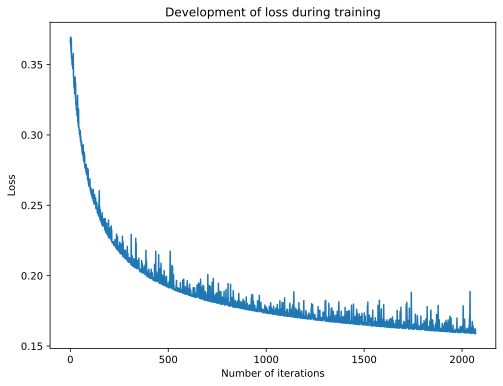

In [ ]:
from sklearn import datasets

# import some data to play with
iris = datasets.load_iris()
X = iris.data[:, :2]  # we only take the first two features.
Y = iris.target

logreg = MultiClassLogisticRegression()

# Create an instance of Logistic Regression Classifier and fit the data.
logreg.fit(X, Y)

# Plot the decision boundary. For that, we will assign a color to each
# point in the mesh [x_min, x_max]x[y_min, y_max].
x_min, x_max = X[:, 0].min() - .5, X[:, 0].max() + .5
y_min, y_max = X[:, 1].min() - .5, X[:, 1].max() + .5
h = .02  # step size in the mesh
xx, yy = np.meshgrid(np.arange(x_min, x_max, h), np.arange(y_min, y_max, h))
Z = logreg.predict_classes(np.c_[xx.ravel(), yy.ravel()])

# Put the result into a color plot
Z = Z.reshape(xx.shape)
plt.figure(1, figsize=(4, 3))
plt.pcolormesh(xx, yy, Z, cmap=plt.cm.Paired)

# Plot also the training points
plt.scatter(X[:, 0], X[:, 1], c=Y, edgecolors='k', cmap=plt.cm.Paired)
plt.xlabel('Sepal length')
plt.ylabel('Sepal width')

plt.xlim(xx.min(), xx.max())
plt.ylim(yy.min(), yy.max())
plt.xticks(())
plt.yticks(())

plt.show()
logreg.score(X, Y)
fig = plt.figure(figsize=(8,6))
plt.plot(np.arange(len(logreg.loss)), logreg.loss)
plt.title("Development of loss during training")
plt.xlabel("Number of iterations")
plt.ylabel("Loss")
plt.show()

### 2.3 Maximum a Posteriori Estimation



Giả sử $P_k(Model)$ xấp xỉ $\mathcal{N}(w_k^Tw_k|0, \lambda^{-1}I)$, thì hàm chính quy hóa của chúng ta sẽ là hàm $L_2$

Gọi $E_D(w)$ là hàm lỗi của dữ liệu huấn luyện, $E_T(w)$ là hàm lỗi của dữ liệu thực tế/kiểm tra, $E_W(w)$ là hàm chính quy hóa, $\lambda$ là hệ số chính quy.

Ta có hàm lỗi như sau: 
$$E(w) = E_D(w) + \lambda E_W(w)$$

Một trong các hàm chính quy hóa là hàm $L_2 = E_W(w) = \frac{1}{2}w^Tw$. Khi áp dụng hàm $L_2$ vào $E_W$ và $NLL$ vào $E_D$, ta có được $$E(w) = NLL + L_2 = -\sum_{n = 1}^N\sum_{k=1}^Kln(y_{nk})*{t_{nk}} + \frac{\lambda}{2}w^Tw$$

$$\nabla_w E = \nabla_w E_D + \nabla_w L_2 = \nabla_w NLL + \lambda w$$

Một hàm chính quy hóa tổng quát hơn đôi khi được sử dụng là $E_W(w) = \frac{\lambda}{2}\sum_{j=1}^{M}|w_j|^q$ với q là bậc của hàm chính quy hóa(q = 2 ~ hàm $L_2$, q = 1 ~ $L_1$) và M là số chiều của vectơ $w$.

Sử dụng hàm $L_2$ còn được gọi là Ridge Regression, và hàm $L_1$ còn được gọi là Lasso Regression.

### 2.4 MaxEnt


MaxEnt(Maximum Entropy Classifier) là model có dạng như sau:

$p(y=c|x,w) = \frac{1}{Z(w,x)}e^{w^T\phi(x,c))}$

(Với $Z$ là hàm phân hoạch, 

$w$ là weight vectơ,

$x$ là vectơ dữ liệu, 

$\phi(x,c)$ là vectơ đặc trưng cho lớp c.)

Trong đó, hồi quy logistic nhiều biến là một trường hợp của MaxEnt với $w^T\phi(x,c) = w^T_cx$.

MaxEnt được sử dụng nhiều trong xử lý ngôn ngữ tự nhiên. Một ví dụ điển hình là bài toán gán nhãn vai trò ngữ nghĩa rằng chúng ta cần phân loại từ x vào một trong các vai trò như người, nơi chốn hoặc đồ vật. Chúng ta có thể có một số đặc trưng(nhị phân) như:

$\phi_1(x,y) = \mathbb{I}(y = $người và $x$ là tên riêng thông thường$)$

$\phi_1(x,y) = \mathbb{I}(y = $người và $x$ là xuất hiện sau từ "của"$)$

$\phi_1(x,y) = \mathbb{I}(y = $nơi chốn và $x$ chứa từ hồ$)$

Vậy làm sao để tạo ra được các hàm đặc trưng như vậy?


1.   Tạo ra thật nhiều hàm bằng tay, sau đó sử dụng các thuật toán chọn lựa hàm đặc trưng, như sử dụng nhóm Lasso(bởi chính quy hóa $L_1$ sẽ có xu hướng loại bỏ các đặc trưng, hàm phân lớp không cần thiết). 
2.   Xây dựng thuật toán lần lượt xây dựng và thêm các hàm đặc trưng vào mô hình bằng phương pháp heuristic.


###2.5 Hierarchical classification



Đôi khi, nhãn có thể được tổ chức dưới dạng hình cây. Ví dụ như ta muốn dự đoán rằng đây là con vật gì. Nếu nó là chó, thì nó có thể là giống chó Bécgiê hay giống chó Phú Quốc, ... Giả sử như nó dự đoán rằng p(chó) = 0.89, p(Bécgiê|chó) = 0.3, p(Phú Quốc|chó) = 0.35,... thì tốt nhất mô hình của chúng ta nên gán nhãn con vật đó là con chó.

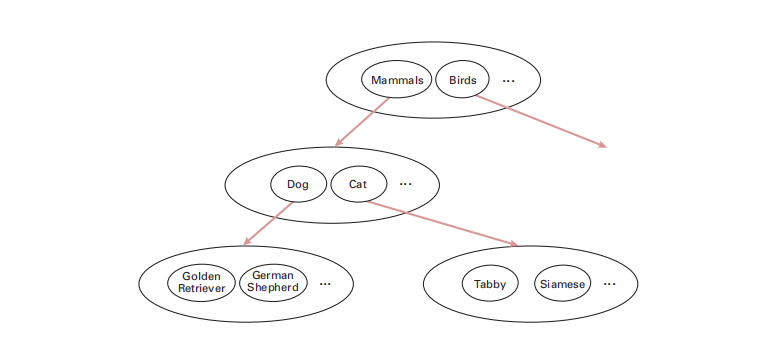

Một cách đơn giản là ta tiền xử lý dữ liệu nhãn đầu vào. Như nếu dữ liệu nhãn là chó Phú Quốc, thì ta gán cho nó thêm nhãn chó, và động vật có vú vào. Sau đó ta chạy một mô hình logistic để phân loại. Tuy nhiên, cách này có thể dẫn đến p(chó) + p(mèo) + p(Bécgiê) + p(mèo mun) + ... =  1, trong khi thực ra Bécgiê là tập hợp con của chó bởi mô hình giả sử rằng chó và bécgiê là 2 biến cố độc lập với nhau. Để khắc phục được điều này, ta thêm vào một số điều kiện để thỏa mãn tính chất của cây.

Điều này cũng làm giảm đáng kể chi phí train của thuật toán. Tương tự ý tưởng đó, người ta cũng xấp xỉ hàm softmax bằng cây. Điều này đặc biệt hiệu quả khi số lượng lớp quá nhiều, điển hình như trong mô hình word2vec phải phân loại với số lượng lớp là số lượng từ trong ngôn ngữ. Cách xây dựng cây phổ biến ở mô hình softmax hình cây là sử dụng mã hóa Huffman.

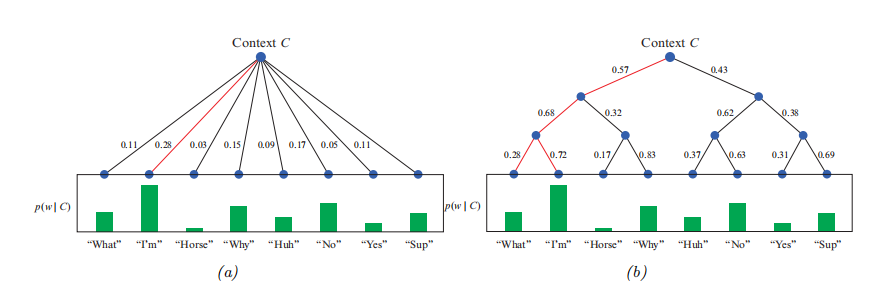

## 3) Robust Logistic Regression

Đối với các bài toán classification có outliers, chúng 
ta sẽ sử dụng **Robust Logistic Regression** 

### 3.1 Mixture model cho các likelihood



Cách đơn giản để xác định mô hình Robust Logistic Regression là sửa đổi likelihood sao cho xác suất output label $y$ được tạo ra ngẫu nhiên là $\pi$, và phần còn lại sẽ tạo ra bằng mô hình thông thường. Tức là, giá trị $\pi$ là sẽ giá trị hiệu chỉnh.

Đối với bài toán Binary Classification, thì nó sẽ trở thành $p(y|\mathbf{x}) =\pi \mathrm{Ber}(y|0.5) + (1-\pi)\mathrm{Ber}(y|\sigma(\mathbf{w}^T\mathbf{x}))$

Việc sử dụng **mixture model** sẽ khiến mô hình trở nên mạnh mẽ hơn và ta có thể được sử dụng cho nhiều model khác nhau (eg: DNNs)

Ví dụ: Ta thêm vào 6 outliers có class = 1  vào tập data 1D dưới đây


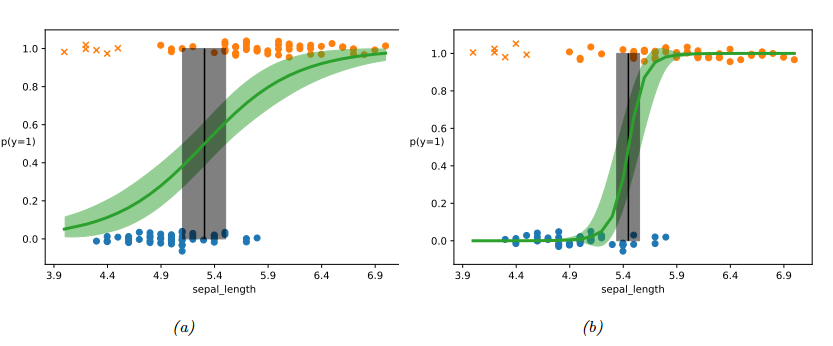

Hình bên trái sử dụng Bayesian logistic regression model. Hình bên phải sử dụng Robust model

### 3.2 Bi-tempered loss


Đối với các data point được dán nhãn sai ở xa đường phân cách sẽ làm ảnh hưởng xấu đến model nếu như loss function là hàm lồi. Chúng ta có thể khắc phục điều này bằng **phiên bản "tempered"**, ta có thể sử dụng tham số temperature $0\leq t_1 < 1$ để giảm tổn thất với outliers. 
Ta  xét entropy loss funtion sau:
$$\mathcal{L}(\mathbf y,\mathbf {\hat y}) = \mathbb{H}(\mathbf y,\mathbf {\hat y}) = \sum _{c}y_c\log \hat y_c$$
Ta định nghĩa tempered cross entropy loss function là:
$$\mathcal{L}(\mathbf y,\mathbf {\hat y}) =\sum_c \left [y_c\left (\log_{t_1} y_c - \log_{t_1}\hat y_c  \right ) -\frac{1}{2-t_1}\left( y_c^{2-t_1} -\hat y_c ^{2-t_1}\right)\right ]$$

Trong đó, phiên bản "tempered" của hàm $\log_t$ được định nghĩa là
$\log_t\left (x\right )\overset{\triangle}{=}\frac{1}{1-t}\left(x^{1-t}-1\right )$ 

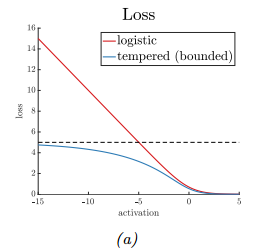

Hình bên trên mô tả logistic loss và tempered logistic loss với $t_1=0.8$. Ta thấy logistic loss đang giảm xuống về logarit tự nhiên (tương tự cho trường hợp tempered logistic với $t_1=1$). Tuy nhiên, hàm tempered log nó sẽ nằm dưới đường $-\frac{1}{1-t_1}$ với $0\leq t_1 <1$.


Trường hợp thứ hai là đối với các data point được dán nhẵn sai ở gần đường phân cách, cần dùng một hàm transfer (ánh xạ từ $\mathbb{R}^C$ đến xác suất $[0,1]^C$ nó heavy tails ([minh họa](https://www.researchgate.net/profile/Roger-Brown-13/publication/228779329/figure/fig4/AS:300865614303236@1448743360655/The-normal-and-the-heavy-tailed-distribution-on-a-single-plot.png)) hơn so với hàm softmax. Ta có, hàm softmax tiêu chuẩn được xác định là
$$\hat y_c=\frac{\exp(a_c)}{\sum_{c'=1}^{C}\exp(a_{c'})}=\exp \left[a_c -\log \sum_{c'=1}^C \exp(a_{c'}) \right ]$$
với $\mathbf{a}$ là logits vector được nghĩa ở trên là $\mathbf{a}=\mathbf{Wx} $.

Chúng ta tạo ra **phiên bản heavy tailed** bằng cách sử dụng hàm **tempered softmax**, ta sử dụng một tham số "temperature" $t_2>1>t_1$ như sau: 
$$\hat y_c=\exp_{t_2}\left[a_c-\lambda_{t_2}(\mathbf{a})\right]$$
trong đó hàm $\exp_t$ phiên bản "tempered" được định nghĩa là
$$\exp_t(x)\overset{\triangle}{=} \left[ 1+(1-t)x\right]^{\frac{1}{1-t}}_+$$
Vấn đề của việc này việc tính $\lambda_{t_2}(\mathbf a)$. Nó phải thỏa mãn phương trình sau:
$$\sum_c\exp_{t_2}[a_c-\lambda(\mathbf a)]=1$$
Ta sẽ tính $\lambda$ bằng cách sử dụng binary search, hoặc là như sau

---
**Input**: logits vector $\mathbf a$, temperature $t>1$

$\mu\leftarrow \max(\mathbf a)$;

$\mathbf a\leftarrow\mathbf a -\mu$;

**while** $\mathbf a$ phân kỳ **do**
> $Z(\mathbf a)\leftarrow \sum_c \exp_t(a_c)\$;

> $\mathbf a\leftarrow Z(\mathbf a)^{1-t} (\mathbf a-\mu) $;

return $-\log_t \frac{1}{Z(\mathbf a)}+\mu$;

---

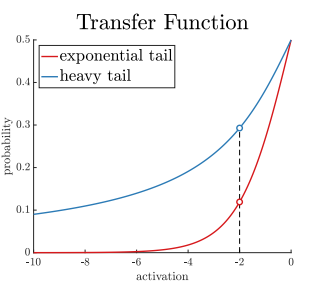

Hình trên biểu diễn hàm sigmoid và hàm tempered sigmoid transfer với $t_2=2.0$. 


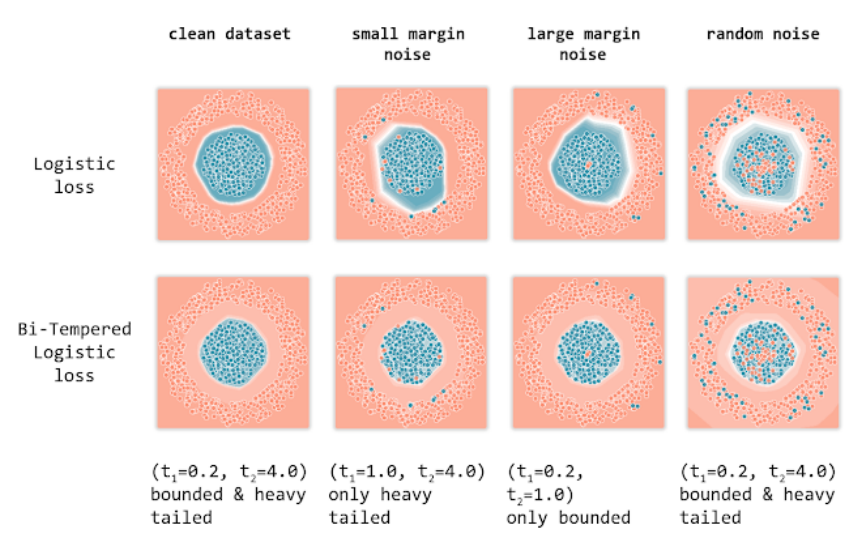

Hình trên minh họa việc sử dụng Logistic Regression và Bi-tempered Logistic Regression tập data có outliers 

##4) Bayesian Logistic Regression

Chúng ta đã tính được MLE và MAP estimate. Tuy nhiên trong một số trường hợp, ta cần phải tính toán xác suất hậu nghiệm (xác suất posterior), $p(\mathbf w|\mathcal D)$ (nó trái ngược lại với hàm likelihood), để tính toán sự không chắc chắn (là xác suất có điều kiện mà nó nhận được khi một bằng chứng có liên quan được xét đến). Bởi vì ta không thế tính chính xác xác suất hậu nghiệm (posterior) như Linear Regression(do phân phối ở đây không phải là phân phối Gaussian nữa) nên ta sẽ tiếp cận phương pháp xấp xỉ Laplace

###(*) Giới thiệu về xấp xỉ Laplace 




Giả sử xác suất hậu nghiệm (posterior) được định nghĩa như sau
$p(\mathbf z|\mathcal D)=\frac{1}{Z}e^{-\varepsilon(\mathbf z)}$

Ở đây, $\mathbf z$ là một vector, $\varepsilon (\mathbf z) = \log p(\mathbf z,\mathcal D)$ được gọi là hàm energy và $Z=p(\mathcal D)$ là hằng số chuẩn hóa

Sử dụng xấp xỉ Taylor đến đạo hàm cấp 2 với $\hat {\mathbf z}$, ta được
$$\varepsilon(\mathbf z) \approx \varepsilon(\hat{\mathbf z})+ \nabla \varepsilon(\hat {\mathbf z}) (\mathbf z - \hat{\mathbf z})+ \frac{1}{2}(\mathbf z - \hat{\mathbf z})^{\mathrm T}\nabla^2\varepsilon(\hat {\mathbf z})(\mathbf z-\hat{\mathbf z}) $$

Trong đó, $\nabla^2 \varepsilon(\hat{\mathbf z})= \mathbf H$ là ma trận Hesse 

Chọn $\hat{\mathbf z}$ sao cho $\nabla\varepsilon({\hat{\mathbf z}})=0$, ta có 

$$\hat p(\mathbf z|\mathcal D)=e^{-\varepsilon(\mathbf z)}\approx e^{-\varepsilon(\hat{\mathbf z})} \cdot \exp \left[-\frac{1}{2}(\mathbf z - \hat{\mathbf z})^{\mathrm T} \mathbf H(\mathbf z-\hat{\mathbf z}) \right]$$

Ta cần tính giá trị của $Z$, ta sử dụng phân phối Gaussian để chuẩn hóa
$$Z=\int _{-\infty}^{\infty}e^{-\varepsilon (\mathbf z)}d \mathbf z\approx e^{-\varepsilon(\hat{\mathbf z})} \int _{-\infty}^{\infty}\exp \left[-\frac{1}{2}(\mathbf z - \hat{\mathbf z})^{\mathrm T} \mathbf H(\mathbf z-\hat{\mathbf z}) \right] d\mathbf z$$ 
$$Z=e^{-\varepsilon(\hat{\mathbf z})}\cdot \frac{(2\pi)^{D/2}}{|\mathbf H|^{1/2}}$$
Do đó, 

$$p(\mathbf z|\mathcal D)=\frac{1}{Z}e^{-\varepsilon(\mathbf z)}\approx \frac{(2\pi)^{D/2}}{|\mathbf H|^{1/2}}\exp\left[-\frac{1}{2}(\mathbf z - \hat{\mathbf z})^{\mathrm T} \mathbf H(\mathbf z-\hat{\mathbf z}) \right] =\mathcal {N}\left(\mathbf z|\hat{\mathbf z},\mathbf H^{-1}\right)$$


### 4.1 Xấp xỉ Laplace trong bài toán Bayesian Logistic Regression


Theo như bài toán trên thì ta có, giá trị trung bình của Gaussian sẽ là bằng với MAP estimate ($\hat {\mathbf w}$), và ma trận hiệp phương sai của Gaussian sẽ là ma trận Hesse khả nghịch, do đó, xác suất hậu nghiệm $p(\mathbf w|\mathcal D) \approx \mathcal N(\mathbf w|\hat{\mathbf w},\mathbf H^{-1})$

### 4.2 Xấp xỉ xác suất dự đoán hậu nghiệm 


Xác suất hậu nghiệm $p(\mathbf w| \mathcal D) $ cho ta biết về các tham số được cho bởi data của model. Tuy nhiên, trong các bài toán Machine Learning, chúng ta thường tìm hiểu dự đoán output $\mathbf y$ dựa trên data input $x$ thay vì tìm hiểu các tham số của model. Vì vậy ta sẽ đi tìm hiểu xác suất dự đoán hậu nghiệm.

$$p(\mathbf y|\mathbf x,\mathcal D)=\int p(\mathbf y|\mathbf x, \mathbf w) p(\mathbf w|\mathcal D)d \mathbf w$$

Ta tính $\hat{\mathbf w}$ thông qua MLE hoặc MAP estimate, và sau đó bỏ qua hậu nghiệm không chắc chắn bằng cách giả sử $$ p(\mathbf w|\mathcal D)=\delta (\mathbf w - \hat{\mathbf w})$$. Trong trường hợp này,

$$p(\mathbf y|\mathbf x,\mathcal D)=\int p(\mathbf y|\mathbf x, \mathbf w) \delta (\mathbf w - \hat{\mathbf w})d\mathbf w=p(\mathbf y|\mathbf x,\hat{\mathbf w})$$. 

Tuy nhiên, nếu chúng ta vẫn cần muốn tính toán sự không chắc chắn qua hàm tiền nghiệm, chúng ta cần phải sử dụng xác suất hậu nghiệm không suy biến. Như chúng ta thấy, thông thường sẽ sử dụng Gaussian posterior. Vì vậy, ta có 2 cách khác tiếp cận như sau



#### 4.2.1 Xấp xỉ Monte Carlo




Chúng ta vẽ $S$ mẫu từ hàm hậu nghiệm, sau đó $\mathbf w_s \sim p(\mathbf w|\mathcal D)$, và tính toán
$p(y=1|\mathbf x,\mathcal D) \approx \frac{1}{S}\sum_{s=1}^S\sigma(\mathbf w^T_s\mathbf x)$

Cách này tuy đơn giản, nhưng lại chậm do việc chia ra $S$ mẫu cho mỗii input $\mathbf x$. Nên ta có hướng tiếp cận khác như sau

#### 4.2.2 Xấp xỉ Probit


Vì ở đây ta có, $p(\mathbf w|\mathcal D)\approx \mathcal N(\mathbf w|\mathbf \mu,\mathbf \Sigma)$, nên nó sẽ đơn giản hơn rất nhiều. 

Ta nhận thấy là hàm $\sigma (a)$ có hình dáng tương tự như như hàm Gaussian $\Phi (a)$. Ta có $\sigma (a) \approx \Phi (\lambda a)$ với $\lambda ^2 =\pi/8$. 

Ta có
$$\int \Phi (\lambda a)\mathcal N(a|m,v)da=\Phi\left(\frac{m}{(\lambda^{-2}+v)^\frac{1}{2}}\right)=\Phi\left(\frac{\lambda m}{(1+\lambda^2v)^\frac{1}{2}}\right)\approx \sigma (\kappa (v)m)$$,
trong đó $\kappa (v) \overset{\triangle}{=}\left(1+\frac{\pi v}{8}\right)^{-\frac{1}{2}}$

Nếu như $a=\mathbf x^{\mathrm T}\mathbf w$ thì $p(y=1|\mathbf x, \mathcal D) \approx \sigma (\kappa (v)m)$ 

với $m=\mathbb E[a] =\mathbf x^T\mu,v =Var[a]=\mathbb V[a] = \mathbb V[\mathbf x^T \mathbf w]=\mathbf x^T \mathbf \Sigma \mathbf x$

Ở đây $\Phi^{-1}$ được gọi là hàm probit, nên ta gọi phép này là phép xấp xỉ probit

**Nhận xét:** Sử dụng Bayessian Logistic Regression không làm thay đổi tỷ lệ phân loại sai (trong trường hợp này), nhưng nó đã làm thay đổi giá trị estimate.

Trong trường hợp multiclass, phần mở rộng của phương pháp Spiegelhalter được phát biểu như sau
$$p(y=c|\mathbf x,\mathcal D) \approx \frac{\exp\left(\kappa (v_c)m_c\right)}{\sum_{c'} \exp(\kappa \left(v_{c'})m_{c'}\right)}$$
với  $m_c=\overline {\mathbf m}^{\mathrm T}_c\mathbf x$ và $v_c=\mathbf x^{\mathrm T} \mathbf V_{c,c} \mathbf x$